# Task 2

---

## Predictive modeling of customer bookings

This Jupyter notebook includes some code to get you started with this predictive modeling task. We will use various packages for data manipulation, feature engineering and machine learning.

### Exploratory data analysis

First, we must explore the data in order to better understand what we have and the statistical properties of the dataset.

In [94]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import * 
from sklearn.model_selection import * 


In [95]:
df = pd.read_csv("customer_booking.csv", encoding="ISO-8859-1")
df.head()

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete
0,2,Internet,RoundTrip,262,19,7,Sat,AKLDEL,New Zealand,1,0,0,5.52,0
1,1,Internet,RoundTrip,112,20,3,Sat,AKLDEL,New Zealand,0,0,0,5.52,0
2,2,Internet,RoundTrip,243,22,17,Wed,AKLDEL,India,1,1,0,5.52,0
3,1,Internet,RoundTrip,96,31,4,Sat,AKLDEL,New Zealand,0,0,1,5.52,0
4,2,Internet,RoundTrip,68,22,15,Wed,AKLDEL,India,1,0,1,5.52,0


The `.head()` method allows us to view the first 5 rows in the dataset, this is useful for visual inspection of our columns

In [96]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   num_passengers         50000 non-null  int64  
 1   sales_channel          50000 non-null  object 
 2   trip_type              50000 non-null  object 
 3   purchase_lead          50000 non-null  int64  
 4   length_of_stay         50000 non-null  int64  
 5   flight_hour            50000 non-null  int64  
 6   flight_day             50000 non-null  object 
 7   route                  50000 non-null  object 
 8   booking_origin         50000 non-null  object 
 9   wants_extra_baggage    50000 non-null  int64  
 10  wants_preferred_seat   50000 non-null  int64  
 11  wants_in_flight_meals  50000 non-null  int64  
 12  flight_duration        50000 non-null  float64
 13  booking_complete       50000 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.3+ 

The `.info()` method gives us a data description, telling us the names of the columns, their data types and how many null values we have. Fortunately, we have no null values. It looks like some of these columns should be converted into different data types, e.g. flight_day.

To provide more context, below is a more detailed data description, explaining exactly what each column means:

- `num_passengers` = number of passengers travelling
- `sales_channel` = sales channel booking was made on
- `trip_type` = trip Type (Round Trip, One Way, Circle Trip)
- `purchase_lead` = number of days between travel date and booking date
- `length_of_stay` = number of days spent at destination
- `flight_hour` = hour of flight departure
- `flight_day` = day of week of flight departure
- `route` = origin -> destination flight route
- `booking_origin` = country from where booking was made
- `wants_extra_baggage` = if the customer wanted extra baggage in the booking
- `wants_preferred_seat` = if the customer wanted a preferred seat in the booking
- `wants_in_flight_meals` = if the customer wanted in-flight meals in the booking
- `flight_duration` = total duration of flight (in hours)
- `booking_complete` = flag indicating if the customer completed the booking

Before we compute any statistics on the data, lets do any necessary data conversion

In [97]:
df["flight_day"].unique()

array(['Sat', 'Wed', 'Thu', 'Mon', 'Sun', 'Tue', 'Fri'], dtype=object)

In [5]:
mapping = {
    "Mon": 1,
    "Tue": 2,
    "Wed": 3,
    "Thu": 4,
    "Fri": 5,
    "Sat": 6,
    "Sun": 7,
}

df["flight_day"] = df["flight_day"].map(mapping)

In [6]:
df["flight_day"].unique()

array([6, 3, 4, 1, 7, 2, 5], dtype=int64)

In [7]:
df.describe()

,num_passengers,purchase_lead,length_of_stay,flight_hour,flight_day,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete
count,50000.000000,50000.000000,50000.00000,50000.00000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,1.591240,84.940480,23.04456,9.06634,3.814420,0.668780,0.296960,0.427140,7.277561,0.149560
std,1.020165,90.451378,33.88767,5.41266,1.992792,0.470657,0.456923,0.494668,1.496863,0.356643
min,1.000000,0.000000,0.00000,0.00000,1.000000,0.000000,0.000000,0.000000,4.670000,0.000000
25%,1.000000,21.000000,5.00000,5.00000,2.000000,0.000000,0.000000,0.000000,5.620000,0.000000
50%,1.000000,51.000000,17.00000,9.00000,4.000000,1.000000,0.000000,0.000000,7.570000,0.000000
75%,2.000000,115.000000,28.00000,13.00000,5.000000,1.000000,1.000000,1.000000,8.830000,0.000000
max,9.000000,867.000000,778.00000,23.00000,7.000000,1.000000,1.000000,1.000000,9.500000,1.000000


The `.describe()` method gives us a summary of descriptive statistics over the entire dataset (only works for numeric columns). This gives us a quick overview of a few things such as the mean, min, max and overall distribution of each column.

From this point, you should continue exploring the dataset with some visualisations and other metrics that you think may be useful. Then, you should prepare your dataset for predictive modelling. Finally, you should train your machine learning model, evaluate it with performance metrics and output visualisations for the contributing variables. All of this analysis should be summarised in your single slide.

In [8]:
df

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete
0,2,Internet,RoundTrip,262,19,7,6,AKLDEL,New Zealand,1,0,0,5.52,0
1,1,Internet,RoundTrip,112,20,3,6,AKLDEL,New Zealand,0,0,0,5.52,0
2,2,Internet,RoundTrip,243,22,17,3,AKLDEL,India,1,1,0,5.52,0
3,1,Internet,RoundTrip,96,31,4,6,AKLDEL,New Zealand,0,0,1,5.52,0
4,2,Internet,RoundTrip,68,22,15,3,AKLDEL,India,1,0,1,5.52,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,2,Internet,RoundTrip,27,6,9,6,PERPNH,Australia,1,0,1,5.62,0
49996,1,Internet,RoundTrip,111,6,4,7,PERPNH,Australia,0,0,0,5.62,0
49997,1,Internet,RoundTrip,24,6,22,6,PERPNH,Australia,0,0,1,5.62,0
49998,1,Internet,RoundTrip,15,6,11,1,PERPNH,Australia,1,0,1,5.62,0


In [9]:
print(f'no of columns is {df.shape[1]} and rows is {df.shape[0]}')

no of columns is 14 and rows is 50000


In [10]:
df.isna().sum()
# we have no missing values

num_passengers           0
sales_channel            0
trip_type                0
purchase_lead            0
length_of_stay           0
flight_hour              0
flight_day               0
route                    0
booking_origin           0
wants_extra_baggage      0
wants_preferred_seat     0
wants_in_flight_meals    0
flight_duration          0
booking_complete         0
dtype: int64

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   num_passengers         50000 non-null  int64  
 1   sales_channel          50000 non-null  object 
 2   trip_type              50000 non-null  object 
 3   purchase_lead          50000 non-null  int64  
 4   length_of_stay         50000 non-null  int64  
 5   flight_hour            50000 non-null  int64  
 6   flight_day             50000 non-null  int64  
 7   route                  50000 non-null  object 
 8   booking_origin         50000 non-null  object 
 9   wants_extra_baggage    50000 non-null  int64  
 10  wants_preferred_seat   50000 non-null  int64  
 11  wants_in_flight_meals  50000 non-null  int64  
 12  flight_duration        50000 non-null  float64
 13  booking_complete       50000 non-null  int64  
dtypes: float64(1), int64(9), object(4)
memory usage: 5.3+ 

In [12]:
# we will do some extra data conversions

In [13]:
df.head(5)

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete
0,2,Internet,RoundTrip,262,19,7,6,AKLDEL,New Zealand,1,0,0,5.52,0
1,1,Internet,RoundTrip,112,20,3,6,AKLDEL,New Zealand,0,0,0,5.52,0
2,2,Internet,RoundTrip,243,22,17,3,AKLDEL,India,1,1,0,5.52,0
3,1,Internet,RoundTrip,96,31,4,6,AKLDEL,New Zealand,0,0,1,5.52,0
4,2,Internet,RoundTrip,68,22,15,3,AKLDEL,India,1,0,1,5.52,0


In [14]:
df['wants_extra_baggage'] = df['wants_extra_baggage'].astype(object)
df['wants_preferred_seat'] = df['wants_preferred_seat'].astype(object)
df['wants_in_flight_meals'] = df['wants_in_flight_meals'].astype(object)

In [15]:
df['booking_complete'] = df['booking_complete'].astype(object)

In [16]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
num_passengers,50000.0,1.591240,1.020165,1.00,1.00,1.00,2.00,9.0
purchase_lead,50000.0,84.940480,90.451378,0.00,21.00,51.00,115.00,867.0
length_of_stay,50000.0,23.044560,33.887670,0.00,5.00,17.00,28.00,778.0
flight_hour,50000.0,9.066340,5.412660,0.00,5.00,9.00,13.00,23.0
flight_day,50000.0,3.814420,1.992792,1.00,2.00,4.00,5.00,7.0
flight_duration,50000.0,7.277561,1.496863,4.67,5.62,7.57,8.83,9.5


from intital EDA the max passegener count is 9 with min of 1 and avg of 1 

max purchase lead is 867 2 years in advance  min is 0 may be on the day also booked

max hour of flight is 23 shortest is 5.0

duration of flight min is 4.67 hrs and max is 9.5

**Here we are having the day of the flight we need to understand whether a particular day is more important than the other also we need to find the relation about the hour of the flight with respect to the order completion**

**Since the hour 23 is more close to the hour 0 so we should this in a cyclic manner**

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   num_passengers         50000 non-null  int64  
 1   sales_channel          50000 non-null  object 
 2   trip_type              50000 non-null  object 
 3   purchase_lead          50000 non-null  int64  
 4   length_of_stay         50000 non-null  int64  
 5   flight_hour            50000 non-null  int64  
 6   flight_day             50000 non-null  int64  
 7   route                  50000 non-null  object 
 8   booking_origin         50000 non-null  object 
 9   wants_extra_baggage    50000 non-null  object 
 10  wants_preferred_seat   50000 non-null  object 
 11  wants_in_flight_meals  50000 non-null  object 
 12  flight_duration        50000 non-null  float64
 13  booking_complete       50000 non-null  object 
dtypes: float64(1), int64(5), object(8)
memory usage: 5.3+ 

In [18]:
df

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete
0,2,Internet,RoundTrip,262,19,7,6,AKLDEL,New Zealand,1,0,0,5.52,0
1,1,Internet,RoundTrip,112,20,3,6,AKLDEL,New Zealand,0,0,0,5.52,0
2,2,Internet,RoundTrip,243,22,17,3,AKLDEL,India,1,1,0,5.52,0
3,1,Internet,RoundTrip,96,31,4,6,AKLDEL,New Zealand,0,0,1,5.52,0
4,2,Internet,RoundTrip,68,22,15,3,AKLDEL,India,1,0,1,5.52,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,2,Internet,RoundTrip,27,6,9,6,PERPNH,Australia,1,0,1,5.62,0
49996,1,Internet,RoundTrip,111,6,4,7,PERPNH,Australia,0,0,0,5.62,0
49997,1,Internet,RoundTrip,24,6,22,6,PERPNH,Australia,0,0,1,5.62,0
49998,1,Internet,RoundTrip,15,6,11,1,PERPNH,Australia,1,0,1,5.62,0


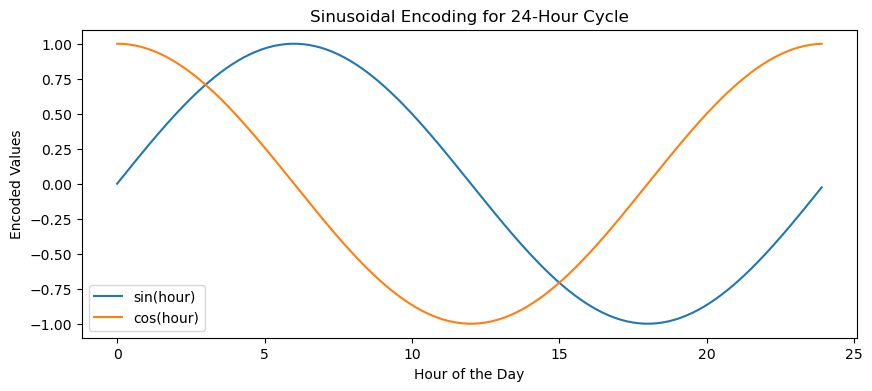

In [19]:
import numpy as np
import matplotlib.pyplot as plt

# Generate values for a 24-hour cycle
hours = np.arange(0, 24, 0.1)
sin_values = np.sin(2 * np.pi * hours / 24)
cos_values = np.cos(2 * np.pi * hours / 24)

# Plot the sinusoidal curves
plt.figure(figsize=(10, 4))
plt.plot(hours, sin_values, label='sin(hour)')
plt.plot(hours, cos_values, label='cos(hour)')
plt.title('Sinusoidal Encoding for 24-Hour Cycle')
plt.xlabel('Hour of the Day')
plt.ylabel('Encoded Values')
plt.legend()
plt.show()

In [20]:
df

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete
0,2,Internet,RoundTrip,262,19,7,6,AKLDEL,New Zealand,1,0,0,5.52,0
1,1,Internet,RoundTrip,112,20,3,6,AKLDEL,New Zealand,0,0,0,5.52,0
2,2,Internet,RoundTrip,243,22,17,3,AKLDEL,India,1,1,0,5.52,0
3,1,Internet,RoundTrip,96,31,4,6,AKLDEL,New Zealand,0,0,1,5.52,0
4,2,Internet,RoundTrip,68,22,15,3,AKLDEL,India,1,0,1,5.52,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,2,Internet,RoundTrip,27,6,9,6,PERPNH,Australia,1,0,1,5.62,0
49996,1,Internet,RoundTrip,111,6,4,7,PERPNH,Australia,0,0,0,5.62,0
49997,1,Internet,RoundTrip,24,6,22,6,PERPNH,Australia,0,0,1,5.62,0
49998,1,Internet,RoundTrip,15,6,11,1,PERPNH,Australia,1,0,1,5.62,0


# Univariate Analysis

num_passengers = number of passengers travelling
sales_channel = sales channel booking was made on
trip_type = trip Type (Round Trip, One Way, Circle Trip)
purchase_lead = number of days between travel date and booking date
length_of_stay = number of days spent at destination
flight_hour = hour of flight departure
flight_day = day of week of flight departure
route = origin -> destination flight route
booking_origin = country from where booking was made
wants_extra_baggage = if the customer wanted extra baggage in the booking
wants_preferred_seat = if the customer wanted a preferred seat in the booking
wants_in_flight_meals = if the customer wanted in-flight meals in the booking
flight_duration = total duration of flight (in hours)
booking_complete = flag indicating if the customer completed the booking

## Here the goal is to predict whether Order is completed or not based on features
## So if the orders are correctly predicted the airline can arrangment for the customers
## FN can result in shortage or resources and FP can result in wastage of resources
## so our model should be able to predict for False Positive and False Negatives
## We can focus on f1 score for model optimization

In [129]:
df

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete
0,2,Internet,RoundTrip,262,19,7,6,AKLDEL,New Zealand,1,0,0,5.52,0
1,1,Internet,RoundTrip,112,20,3,6,AKLDEL,New Zealand,0,0,0,5.52,0
2,2,Internet,RoundTrip,243,22,17,3,AKLDEL,India,1,1,0,5.52,0
3,1,Internet,RoundTrip,96,31,4,6,AKLDEL,New Zealand,0,0,1,5.52,0
4,2,Internet,RoundTrip,68,22,15,3,AKLDEL,India,1,0,1,5.52,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,2,Internet,RoundTrip,27,6,9,6,PERPNH,Australia,1,0,1,5.62,0
49996,1,Internet,RoundTrip,111,6,4,7,PERPNH,Australia,0,0,0,5.62,0
49997,1,Internet,RoundTrip,24,6,22,6,PERPNH,Australia,0,0,1,5.62,0
49998,1,Internet,RoundTrip,15,6,11,1,PERPNH,Australia,1,0,1,5.62,0


In [21]:
df['flight_day'] = df['flight_day'].astype(object)


In [22]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
num_passengers,50000.0,1.591240,1.020165,1.00,1.00,1.00,2.00,9.0
purchase_lead,50000.0,84.940480,90.451378,0.00,21.00,51.00,115.00,867.0
length_of_stay,50000.0,23.044560,33.887670,0.00,5.00,17.00,28.00,778.0
flight_hour,50000.0,9.066340,5.412660,0.00,5.00,9.00,13.00,23.0
flight_duration,50000.0,7.277561,1.496863,4.67,5.62,7.57,8.83,9.5


**the max num passengers is min 1 and max is 9**

**max lead is 867 days and min is 0**

**max length of stay is 778 and min is 0**

**flight duration is max of 9.5 and min of 4.67**


In [132]:
df.describe(include='object').T

,count,unique,top,freq
sales_channel,50000,2,Internet,44382
trip_type,50000,3,RoundTrip,49497
flight_day,50000,7,1,8102
route,50000,799,AKLKUL,2680
booking_origin,50000,104,Australia,17872
wants_extra_baggage,50000,2,1,33439
wants_preferred_seat,50000,2,0,35152
wants_in_flight_meals,50000,2,0,28643
booking_complete,50000,2,0,42522


**the top route is AKLKUL** 

**the top country of origin for booking is australia**

**the top route is AKL to KUL**



In [23]:
df['route'].apply(lambda x : x[:3]).value_counts()

DMK    3747
ICN    3732
MEL    3468
DPS    2902
AKL    2849
       ... 
CSX       4
NRT       2
CXR       1
BTJ       1
URT       1
Name: route, Length: 85, dtype: int64

In [24]:
df['route'].apply(lambda x : x[3:]).value_counts()

SYD    6616
PER    4992
MEL    4444
TPE    4044
OOL    2796
       ... 
SWA       3
PDG       1
LBU       1
NRT       1
SRG       1
Name: route, Length: 64, dtype: int64

# Auto Eda

In [152]:
!pip install -c pyviz hvplot


ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'pyviz'


In [154]:

import sweetviz as sv
sweet_report = sv.analyze(df)
sweet_report.show_html('sweet_report.html')



                                             |                                             | [  0%]   00:00 ->…

Report sweet_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.
Solving environment: ...working... failed with initial frozen solve. Retrying with flexible solve.
Solving environment: ...working... failed with repodata from current_repodata.json, will retry with next repodata source.
Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\ajish\anaconda3

  added / updated specs:
    - hvplot


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    _anaconda_depends-2022.10  |           py39_2          68 KB
    anaconda-custom            |           py39_2          13 KB
    ca-certificates-2023.12.12 |       haa95532_0         127 KB
    joblib-1.2.0               |   py39haa95532_0         388 KB
    nltk-3.8.1                 |   py39haa95532_0         2.2 MB
   


The environment is inconsistent, please check the package plan carefully
The following packages are causing the inconsistency:

  - defaults/noarch::alabaster==0.7.12=pyhd3eb1b0_0
  - defaults/win-64::anaconda==2022.10=py39_0
  - defaults/win-64::anaconda-client==1.11.0=py39haa95532_0
  - defaults/win-64::anaconda-navigator==2.4.2=py39haa95532_0
  - defaults/win-64::anaconda-project==0.11.1=py39haa95532_0
  - defaults/win-64::anyio==3.5.0=py39haa95532_0
  - defaults/noarch::appdirs==1.4.4=pyhd3eb1b0_0
  - defaults/noarch::argon2-cffi==21.3.0=pyhd3eb1b0_0
  - defaults/win-64::argon2-cffi-bindings==21.2.0=py39h2bbff1b_0
  - defaults/noarch::arrow==1.2.2=pyhd3eb1b0_0
  - defaults/win-64::astroid==2.11.7=py39haa95532_0
  - defaults/win-64::astropy==5.1=py39h080aedc_0
  - defaults/noarch::atomicwrites==1.4.0=py_0
  - defaults/noarch::attrs==21.4.0=pyhd3eb1b0_0
  - defaults/noarch::automat==20.2.0=py_0
  - defaults/noarch::autopep8==1.6.0=pyhd3eb1b0_1
  - defaults/noarch::babel==2.9.1=pyhd3

!pip install dataprep

In [159]:
import pandas as pd
from dataprep.eda import create_report

In [ ]:
create_report(df)

# So numerical data is skewed and there is  presence of duplicate values
# High cardinal Features in data like country of origin and route

In [166]:
# We split the route to make origin and destination separate


In [25]:
df1 = df.copy()

In [26]:
df1['Origin'] = df1['route'].apply(lambda x : x[:3])

df1['Destination'] = df1['route'].apply(lambda x : x[3:])

In [27]:
# we have made the data more granualr by making separate column for orgign and destination

In [28]:
df1.head(5)

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete,Origin,Destination
0,2,Internet,RoundTrip,262,19,7,6,AKLDEL,New Zealand,1,0,0,5.52,0,AKL,DEL
1,1,Internet,RoundTrip,112,20,3,6,AKLDEL,New Zealand,0,0,0,5.52,0,AKL,DEL
2,2,Internet,RoundTrip,243,22,17,3,AKLDEL,India,1,1,0,5.52,0,AKL,DEL
3,1,Internet,RoundTrip,96,31,4,6,AKLDEL,New Zealand,0,0,1,5.52,0,AKL,DEL
4,2,Internet,RoundTrip,68,22,15,3,AKLDEL,India,1,0,1,5.52,0,AKL,DEL


In [29]:
df1[df1.duplicated()]

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete,Origin,Destination
196,5,Internet,RoundTrip,206,17,13,7,AKLKUL,Malaysia,1,0,0,8.83,0,AKL,KUL
316,5,Internet,RoundTrip,206,17,13,7,AKLKUL,Malaysia,1,0,0,8.83,0,AKL,KUL
384,5,Internet,RoundTrip,206,17,13,7,AKLKUL,Malaysia,1,0,0,8.83,0,AKL,KUL
456,1,Internet,RoundTrip,30,85,15,5,AKLKUL,Malaysia,1,0,0,8.83,1,AKL,KUL
513,3,Internet,RoundTrip,109,20,4,2,AKLKUL,Singapore,1,0,1,8.83,0,AKL,KUL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49852,2,Internet,RoundTrip,204,6,14,2,PENTPE,Malaysia,1,0,0,4.67,0,PEN,TPE
49902,1,Mobile,RoundTrip,106,6,11,5,PENTPE,Taiwan,1,0,0,4.67,0,PEN,TPE
49934,1,Internet,RoundTrip,2,6,3,4,PENTPE,Malaysia,0,0,1,4.67,0,PEN,TPE
49944,1,Internet,RoundTrip,2,6,3,4,PENTPE,Malaysia,0,0,1,4.67,0,PEN,TPE


In [30]:
df1.drop_duplicates(inplace=True)

# Univariate Analysis

## Target Column  - Order Completed

In [31]:
df.head(1)

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete
0,2,Internet,RoundTrip,262,19,7,6,AKLDEL,New Zealand,1,0,0,5.52,0


In [32]:
df['booking_complete'] = df['booking_complete'].map({1:'Yes',0:'No'})

# Data is imbalanced only 15% for +ve class

In [33]:
df['booking_complete'].value_counts(normalize=True)


No     0.85044
Yes    0.14956
Name: booking_complete, dtype: float64

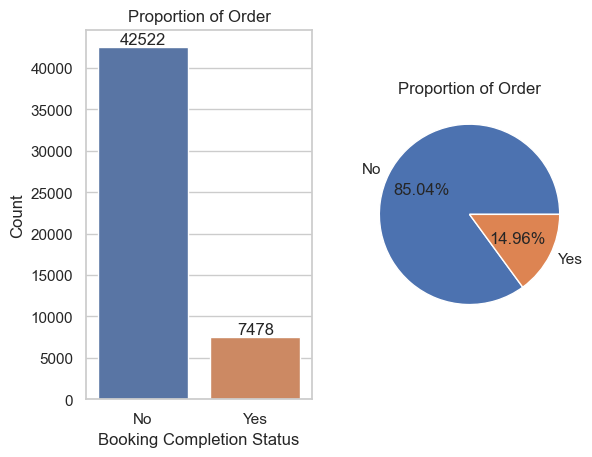

In [34]:
sns.set(style="whitegrid")

plt.subplot(1, 2, 1)
ax = sns.countplot(x='booking_complete', data=df)

for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom')

plt.xlabel('Booking Completion Status')
plt.ylabel('Count')
plt.title('Proportion of Order')

plt.subplot(1, 2, 2)

a = df['booking_complete'].value_counts()
plt.pie(a, labels=a.index, autopct='%0.2f%%')

plt.title('Proportion of Order')

plt.show()

In [35]:
df.select_dtypes(include=object).columns

Index(['sales_channel', 'trip_type', 'flight_day', 'route', 'booking_origin',
       'wants_extra_baggage', 'wants_preferred_seat', 'wants_in_flight_meals',
       'booking_complete'],
      dtype='object')

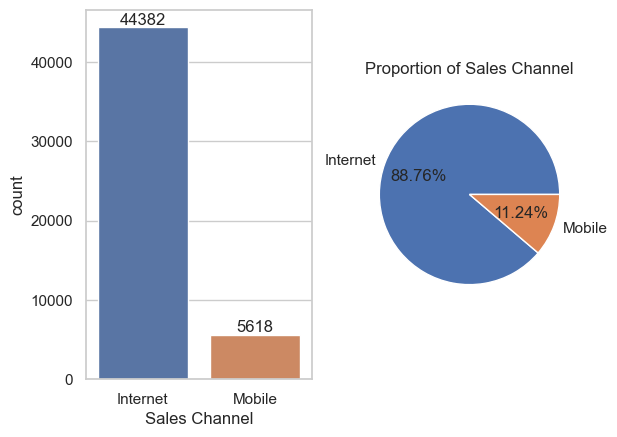

In [145]:
sns.set(style="whitegrid")

plt.subplot(1, 2, 1)
ax = sns.countplot(x='sales_channel', data=df)

for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom')

plt.xlabel('Sales Channel')


plt.subplot(1, 2, 2)

a = df['sales_channel'].value_counts()
plt.pie(a, labels=a.index, autopct='%0.2f%%')

plt.title('Proportion of Sales Channel')

plt.show()

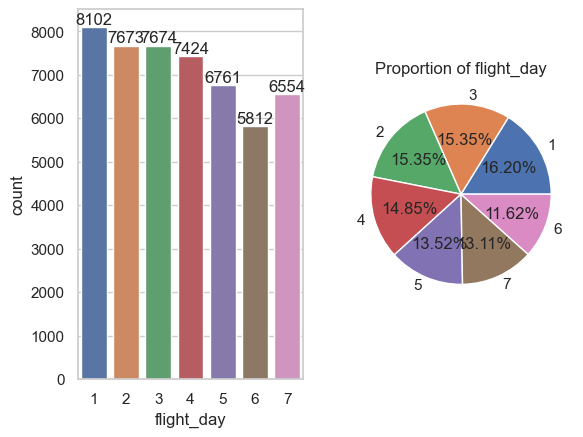

In [148]:
sns.set(style="whitegrid")

plt.subplot(1, 2, 1)
ax = sns.countplot(x='flight_day', data=df)

for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom')

plt.xlabel('flight_day')


plt.subplot(1, 2, 2)

a = df['flight_day'].value_counts()
plt.pie(a, labels=a.index, autopct='%0.2f%%')

plt.title('Proportion of flight_day')

plt.show()

## Monday is one and sunday is seven more proportion of flights are on week day and with monday having the highest proportion and saturday and sunday being the least in count 
## Also to encode the Time of flight we will use Sine or Cosine Transformation

In [177]:
# we will proceed with Multivariate Analysis to get more insight about the Data

In [36]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49281 entries, 0 to 49999
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   num_passengers         49281 non-null  int64  
 1   sales_channel          49281 non-null  object 
 2   trip_type              49281 non-null  object 
 3   purchase_lead          49281 non-null  int64  
 4   length_of_stay         49281 non-null  int64  
 5   flight_hour            49281 non-null  int64  
 6   flight_day             49281 non-null  object 
 7   route                  49281 non-null  object 
 8   booking_origin         49281 non-null  object 
 9   wants_extra_baggage    49281 non-null  object 
 10  wants_preferred_seat   49281 non-null  object 
 11  wants_in_flight_meals  49281 non-null  object 
 12  flight_duration        49281 non-null  float64
 13  booking_complete       49281 non-null  object 
 14  Origin                 49281 non-null  object 
 15  De

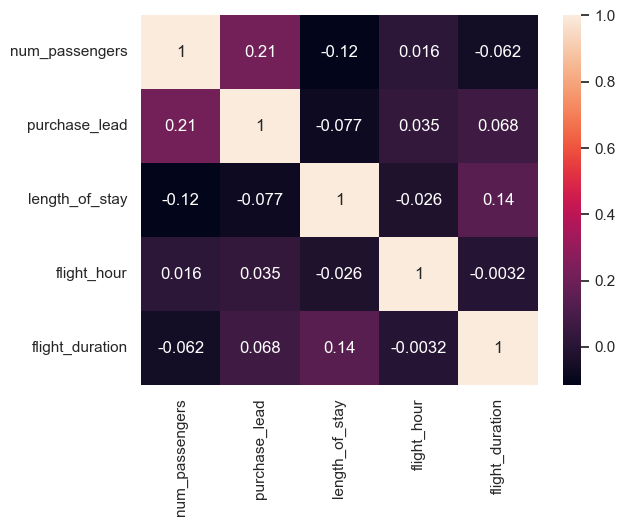

In [37]:
sns.heatmap(df1.corr(),annot=True)
plt.show()

<AxesSubplot:xlabel='num_passengers', ylabel='purchase_lead'>

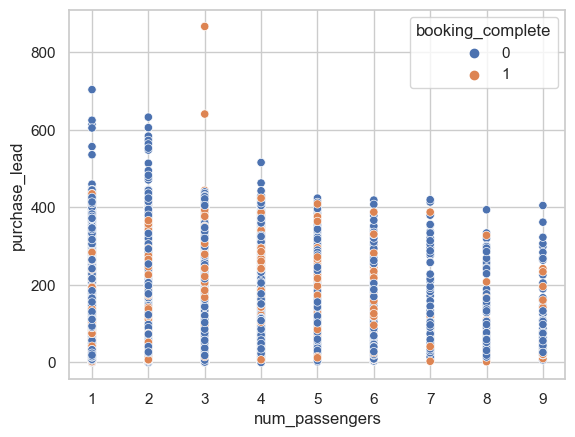

In [39]:
sns.scatterplot(df1['num_passengers'],df1['purchase_lead'],hue=df1['booking_complete'])

<AxesSubplot:xlabel='length_of_stay', ylabel='purchase_lead'>

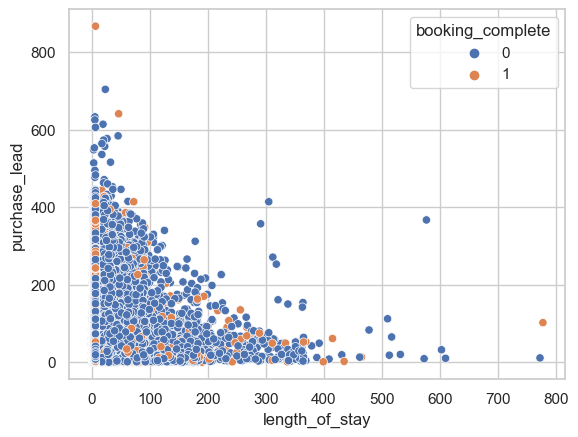

In [40]:
sns.scatterplot(df1['length_of_stay'],df1['purchase_lead'],hue=df1['booking_complete'])

In [53]:
df1.head(2)

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete,Origin,Destination
0,2,Internet,RoundTrip,262,19,7,6,AKLDEL,New Zealand,1,0,0,5.52,0,AKL,DEL
1,1,Internet,RoundTrip,112,20,3,6,AKLDEL,New Zealand,0,0,0,5.52,0,AKL,DEL


In [52]:
pd.crosstab(df1['sales_channel'],df1['booking_complete'],margins=True,normalize='index')
# almost 10-15% booking were completed in both category

booking_complete,0,1
sales_channel,,
Internet,0.845117,0.154883
Mobile,0.890194,0.109806
All,0.850023,0.149977


<AxesSubplot:xlabel='sales_channel'>

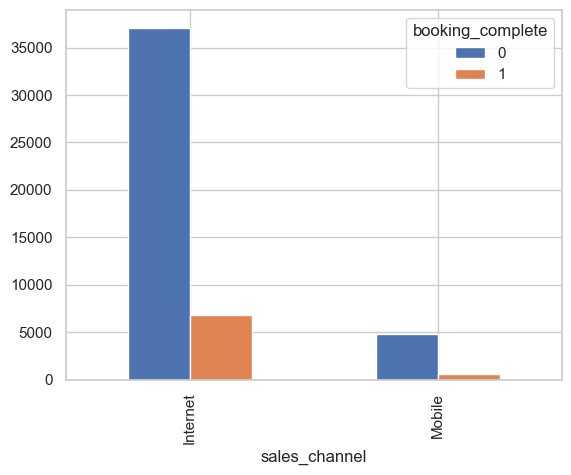

In [43]:
pd.crosstab(df1['sales_channel'],df1['booking_complete']).plot(kind ='bar')

In [57]:
df1.groupby(['sales_channel','trip_type'])[['booking_complete']].count()

booking_complete
sales_channel trip_type                   
Internet      CircleTrip               112
              OneWay                   369
              RoundTrip              43436
Mobile        CircleTrip                 4
              OneWay                    17
              RoundTrip               5343

In [58]:
df1['trip_type'].value_counts()

RoundTrip     48779
OneWay          386
CircleTrip      116
Name: trip_type, dtype: int64

<AxesSubplot:ylabel='Density'>

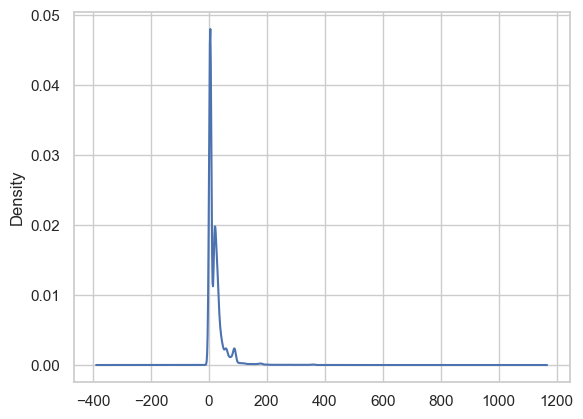

In [63]:
df1[df1['trip_type'] == 'RoundTrip']['length_of_stay'].plot(kind='kde')

<AxesSubplot:ylabel='Density'>

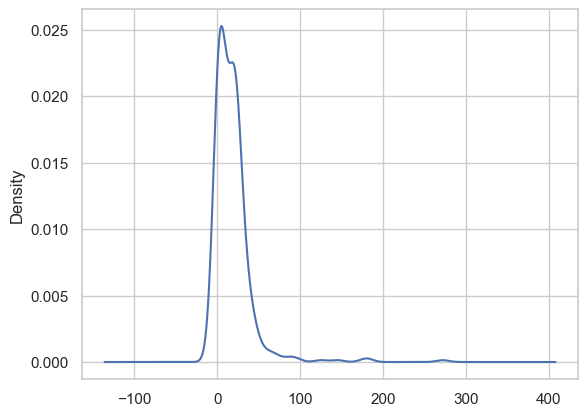

In [62]:
df1[df1['trip_type'] == 'OneWay']['length_of_stay'].plot(kind='kde')

In [64]:
df1[df1['trip_type'] == 'RoundTrip'][['length_of_stay','purchase_lead']]

,length_of_stay,purchase_lead
0,19,262
1,20,112
2,22,243
3,31,96
4,22,68
...,...,...
49995,6,27
49996,6,111
49997,6,24
49998,6,15


In [65]:
df1.head(2)

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete,Origin,Destination
0,2,Internet,RoundTrip,262,19,7,6,AKLDEL,New Zealand,1,0,0,5.52,0,AKL,DEL
1,1,Internet,RoundTrip,112,20,3,6,AKLDEL,New Zealand,0,0,0,5.52,0,AKL,DEL


In [67]:
pd.crosstab([df1['sales_channel'],df1['trip_type']],df1['booking_complete'])

booking_complete              0     1
sales_channel trip_type              
Internet      CircleTrip    107     5
              OneWay        351    18
              RoundTrip   36657  6779
Mobile        CircleTrip      4     0
              OneWay         15     2
              RoundTrip    4756   587

<AxesSubplot:xlabel='sales_channel,trip_type'>

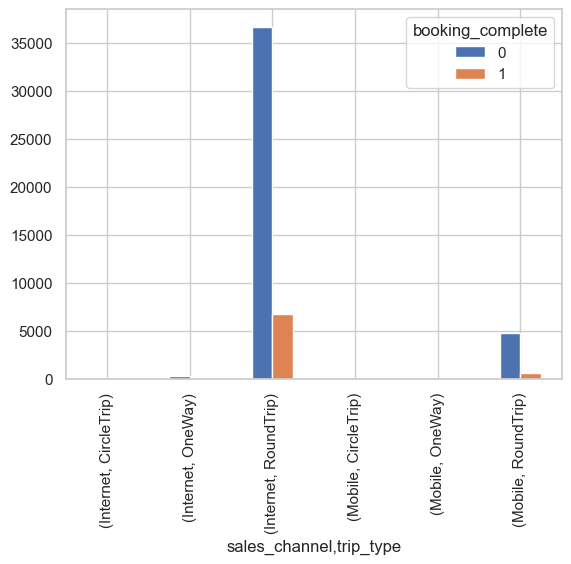

In [71]:
pd.crosstab([df1['sales_channel'],df1['trip_type']],df1['booking_complete']).plot(kind='bar')


In [70]:
pd.crosstab([df1['sales_channel'],df1['trip_type']],df1['booking_complete'],normalize='index')
#15 % of roundtrips through net was booked while 10% via mobile
# 0 % circle trips via mobile were completed

booking_complete                 0         1
sales_channel trip_type                     
Internet      CircleTrip  0.955357  0.044643
              OneWay      0.951220  0.048780
              RoundTrip   0.843931  0.156069
Mobile        CircleTrip  1.000000  0.000000
              OneWay      0.882353  0.117647
              RoundTrip   0.890137  0.109863

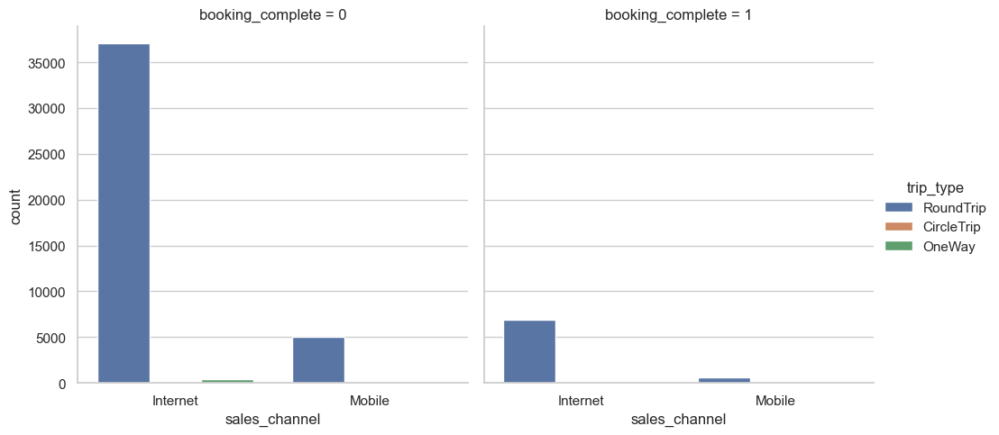

In [121]:
sns.catplot(x='sales_channel', hue='trip_type', col='booking_complete', data=df, kind='count',)

In [73]:
df1.head(2)

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete,Origin,Destination
0,2,Internet,RoundTrip,262,19,7,6,AKLDEL,New Zealand,1,0,0,5.52,0,AKL,DEL
1,1,Internet,RoundTrip,112,20,3,6,AKLDEL,New Zealand,0,0,0,5.52,0,AKL,DEL


<AxesSubplot:xlabel='flight_hour', ylabel='count'>

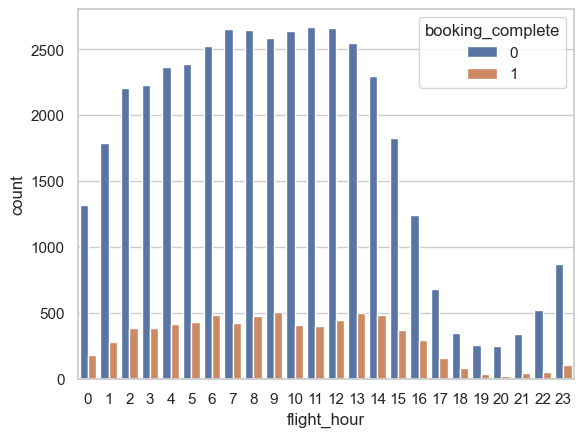

In [75]:
sns.countplot(df1['flight_hour'],hue=df1['booking_complete'])
# more people prefer flying from 12 am to 18 then there is  dip

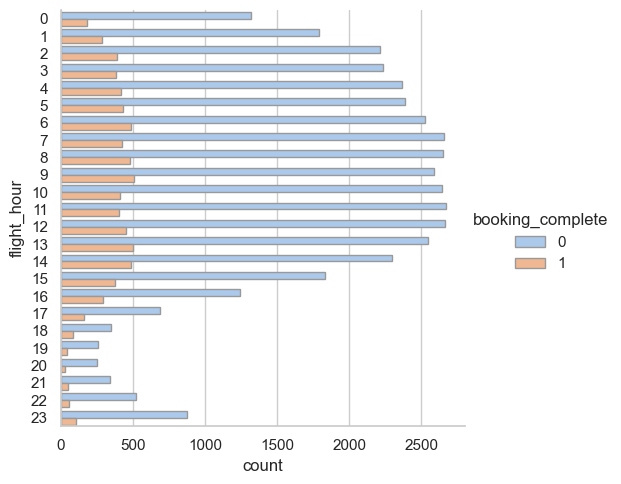

In [122]:
sns.catplot(
    data=df1, y="flight_hour", hue="booking_complete", kind="count",
    palette="pastel", edgecolor=".6",
)

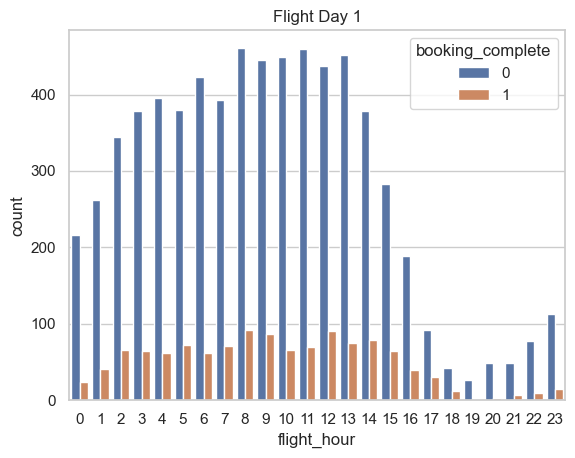

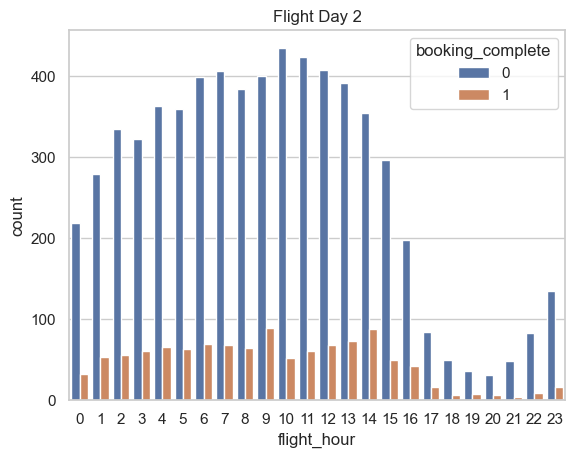

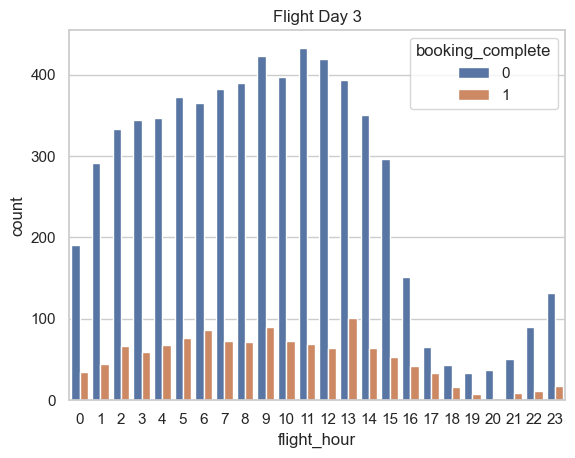

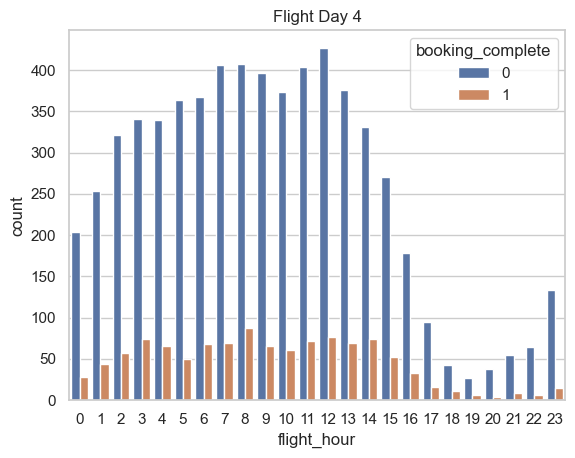

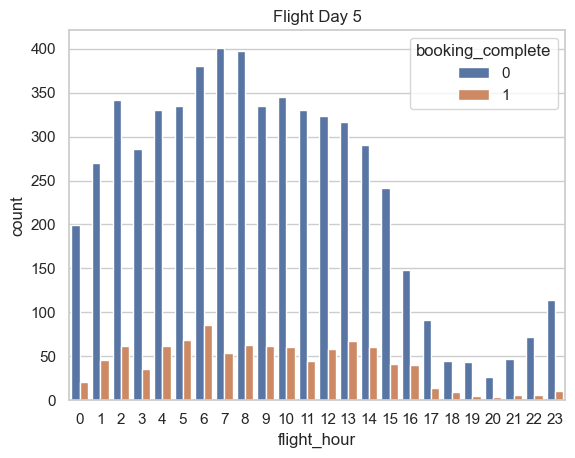

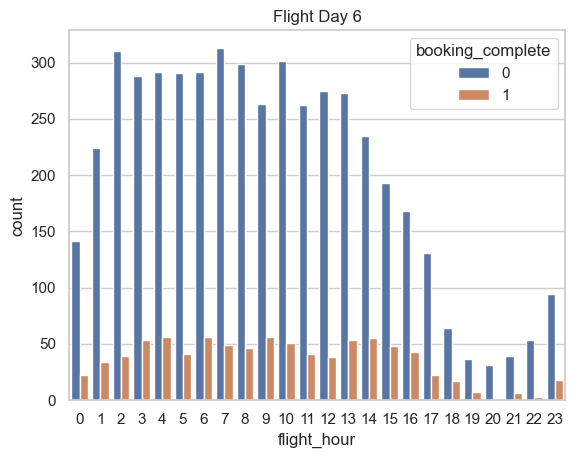

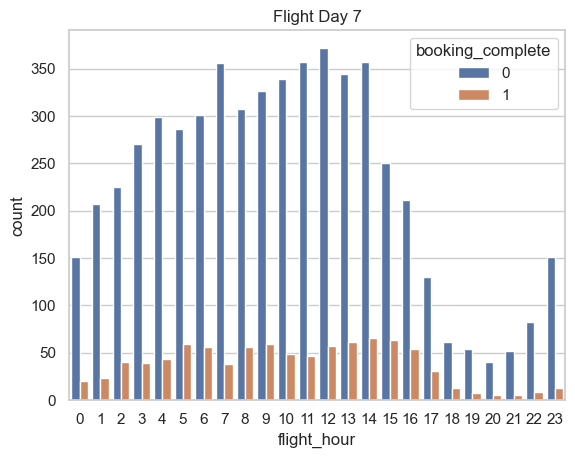

In [126]:
for i in [1, 2, 3, 4, 5, 6, 7]:
    subset_data = df1[df1['flight_day'] == i]
    sns.countplot(data=subset_data, x='flight_hour', hue='booking_complete')
    plt.title(f'Flight Day {i}')
    plt.show()

# Its evident from the visualization proportion bookings across hours of the day across diff days of the week are same

In [92]:
pd.crosstab(df1['flight_hour'],df1['booking_complete']).sort_values(by =1,ascending=False)
# 9 am has max booking completeion 
# followed by 13 14 and least for 25 

booking_complete,0,1
flight_hour,,
9,2590,507
13,2547,499
14,2298,485
6,2528,482
8,2647,478
12,2663,451
5,2388,429
7,2658,422
4,2367,419


In [86]:
a = pd.crosstab([df1['flight_day'],df1['flight_hour']],df1['booking_complete']).reset_index().sort_values(by=1,ascending=False)
a.head(10)

booking_complete,flight_day,flight_hour,0,1
61,3,13,393,101
8,1,8,461,91
12,1,12,437,90
57,3,9,423,90
33,2,9,400,89
38,2,14,355,88
9,1,9,445,87
80,4,8,407,87
54,3,6,365,86
102,5,6,381,85


In [ ]:
# we can see that for flight at day - at 13 hrs has max booking completeion followed by day 1 8 am 

In [87]:
a.tail(10)

booking_complete,flight_day,flight_hour,0,1
164,7,20,40,5
115,5,19,43,4
92,4,20,37,4
45,2,21,48,4
20,1,20,48,3
68,3,20,37,3
142,6,22,53,3
116,5,20,26,3
19,1,19,26,1
140,6,20,31,1


In [93]:
df1

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete,Origin,Destination
0,2,Internet,RoundTrip,262,19,7,6,AKLDEL,New Zealand,1,0,0,5.52,0,AKL,DEL
1,1,Internet,RoundTrip,112,20,3,6,AKLDEL,New Zealand,0,0,0,5.52,0,AKL,DEL
2,2,Internet,RoundTrip,243,22,17,3,AKLDEL,India,1,1,0,5.52,0,AKL,DEL
3,1,Internet,RoundTrip,96,31,4,6,AKLDEL,New Zealand,0,0,1,5.52,0,AKL,DEL
4,2,Internet,RoundTrip,68,22,15,3,AKLDEL,India,1,0,1,5.52,0,AKL,DEL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,2,Internet,RoundTrip,27,6,9,6,PERPNH,Australia,1,0,1,5.62,0,PER,PNH
49996,1,Internet,RoundTrip,111,6,4,7,PERPNH,Australia,0,0,0,5.62,0,PER,PNH
49997,1,Internet,RoundTrip,24,6,22,6,PERPNH,Australia,0,0,1,5.62,0,PER,PNH
49998,1,Internet,RoundTrip,15,6,11,1,PERPNH,Australia,1,0,1,5.62,0,PER,PNH


In [147]:
from pandas.plotting import parallel_coordinates
import plotly.express as px

In [136]:
df1['flight_hour'] = df1['flight_hour'].astype(object)

In [144]:
a = df1.select_dtypes(include='number').columns.to_list()
a.append('booking_complete')
a

['num_passengers',
 'purchase_lead',
 'length_of_stay',
 'flight_duration',
 'booking_complete']

# parallel_coordinates to visualize 

<AxesSubplot:>

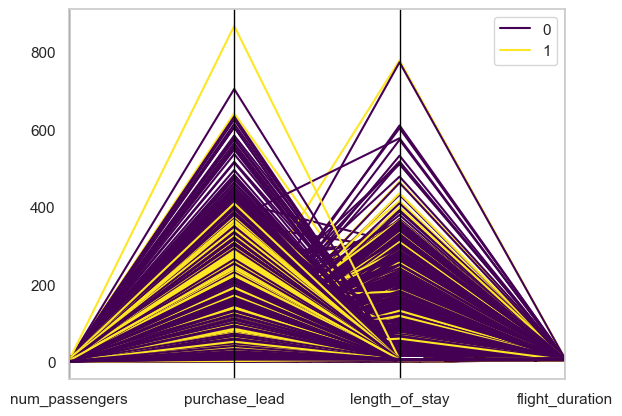

In [146]:
parallel_coordinates(df1[a],class_column='booking_complete',colormap='viridis')
#we can see that data is higly merged together other  than some outlier point 

# Now we will look at proportion for Country of Origin and Route with Target
# Since both are high cardinal features we will make them into groups for better analysis 

# Country Wise Analysis - origin of booking

In [131]:
df1['booking_origin'].value_counts()[:10]
# top 10 countries with booking

Australia      17691
Malaysia        7055
South Korea     4502
Japan           3819
China           3284
Indonesia       2317
Taiwan          2042
Thailand        1993
India           1258
New Zealand     1060
Name: booking_origin, dtype: int64

<AxesSubplot:>

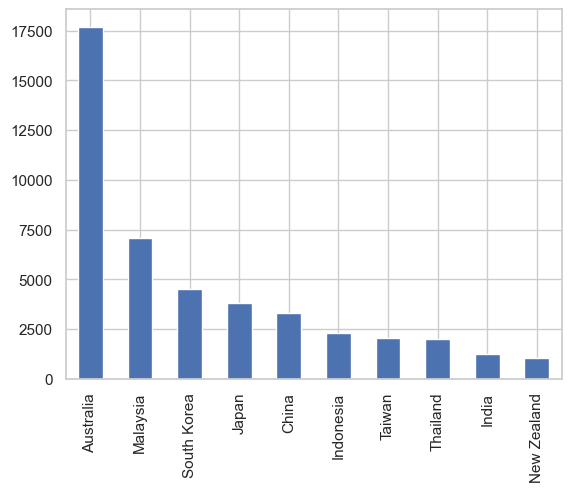

In [132]:
df1['booking_origin'].value_counts()[:10].plot(kind='bar')


<AxesSubplot:xlabel='booking_origin'>

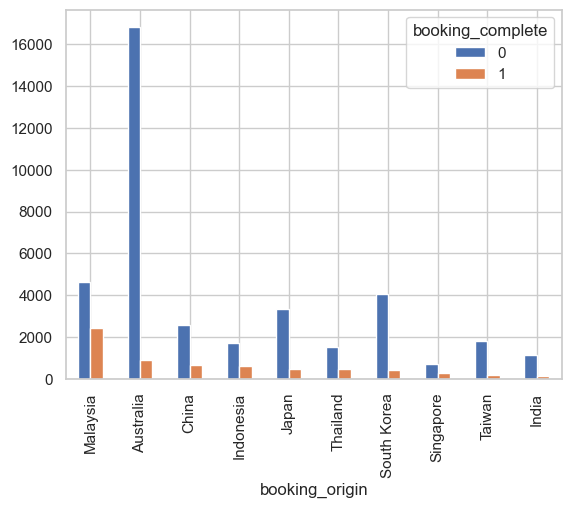

In [153]:
pd.crosstab(df1['booking_origin'],df1['booking_complete']).sort_values(by=1,ascending=False)[:10].plot(kind ='bar')

In [161]:
pd.crosstab(df1['booking_origin'],df1['booking_complete'],normalize='index').head(50).sort_values(by =1,ascending=False)
# countries by max booking %
#australia having max counts but only about 5% completeion

booking_complete,0,1
booking_origin,,
Iraq,0.000000,1.000000
Kazakhstan,0.333333,0.666667
Bahrain,0.400000,0.600000
Denmark,0.571429,0.428571
Kenya,0.666667,0.333333
Cambodia,0.725191,0.274809
Indonesia,0.737160,0.262840
Brunei,0.751553,0.248447
Hong Kong,0.755102,0.244898


In [178]:
df1[['booking_origin','booking_complete']]

,booking_origin,booking_complete
0,New Zealand,0
1,New Zealand,0
2,India,0
3,New Zealand,0
4,India,0
...,...,...
49995,Australia,0
49996,Australia,0
49997,Australia,0
49998,Australia,0


In [189]:
a = pd.crosstab(df1['booking_origin'],df1['booking_complete'])
px.bar(a)
# austraialia has the highest count but malayaisa has the max order completetion

# We will create a continet colum for the countries for better analaysis

In [198]:
!pip install geopy


     ------------------------------------ 125.4/125.4 kB 921.6 kB/s eta 0:00:00
     ---------------------------------------- 40.3/40.3 kB 1.9 MB/s eta 0:00:00


In [202]:
df1['booking_origin'].nunique()
# we have 104 countries

104

In [197]:
df1['booking_origin'].unique()

array(['New Zealand', 'India', 'United Kingdom', 'China', 'South Korea',
       'Japan', 'Malaysia', 'Singapore', 'Switzerland', 'Germany',
       'Indonesia', 'Czech Republic', 'Vietnam', 'Thailand', 'Spain',
       'Romania', 'Ireland', 'Italy', 'Slovakia', 'United Arab Emirates',
       'Tonga', 'Réunion', '(not set)', 'Saudi Arabia', 'Netherlands',
       'Qatar', 'Hong Kong', 'Philippines', 'Sri Lanka', 'France',
       'Croatia', 'United States', 'Laos', 'Hungary', 'Portugal',
       'Cyprus', 'Australia', 'Cambodia', 'Poland', 'Belgium', 'Oman',
       'Bangladesh', 'Kazakhstan', 'Brazil', 'Turkey', 'Kenya', 'Taiwan',
       'Brunei', 'Chile', 'Bulgaria', 'Ukraine', 'Denmark', 'Colombia',
       'Iran', 'Bahrain', 'Solomon Islands', 'Slovenia', 'Mauritius',
       'Nepal', 'Russia', 'Kuwait', 'Mexico', 'Sweden', 'Austria',
       'Lebanon', 'Jordan', 'Greece', 'Mongolia', 'Canada', 'Tanzania',
       'Peru', 'Timor-Leste', 'Argentina', 'New Caledonia', 'Macau',
       'Myanmar (

In [200]:

df1['continent'] = df1['booking_origin'].map(country_to_continent)


In [203]:
country_to_continent_mapping = {
    'New Zealand': 'Oceania',
    'India': 'Asia',
    'United Kingdom': 'Europe',
    'China': 'Asia',
    'South Korea': 'Asia',
    'Japan': 'Asia',
    'Malaysia': 'Asia',
    'Singapore': 'Asia',
    'Switzerland': 'Europe',
    'Germany': 'Europe',
    'Indonesia': 'Asia',
    'Czech Republic': 'Europe',
    'Vietnam': 'Asia',
    'Thailand': 'Asia',
    'Spain': 'Europe',
    'Romania': 'Europe',
    'Ireland': 'Europe',
    'Italy': 'Europe',
    'Slovakia': 'Europe',
    'United Arab Emirates': 'Asia',
    'Tonga': 'Oceania',
    'Réunion': 'Africa',
    '(not set)': 'Unknown',
    'Saudi Arabia': 'Asia',
    'Netherlands': 'Europe',
    'Qatar': 'Asia',
    'Hong Kong': 'Asia',
    'Philippines': 'Asia',
    'Sri Lanka': 'Asia',
    'France': 'Europe',
    'Croatia': 'Europe',
    'United States': 'North America',
    'Laos': 'Asia',
    'Hungary': 'Europe',
    'Portugal': 'Europe',
    'Cyprus': 'Europe',
    'Australia': 'Oceania',
    'Cambodia': 'Asia',
    'Poland': 'Europe',
    'Belgium': 'Europe',
    'Oman': 'Asia',
    'Bangladesh': 'Asia',
    'Kazakhstan': 'Asia',
    'Brazil': 'South America',
    'Turkey': 'Asia',
    'Kenya': 'Africa',
    'Taiwan': 'Asia',
    'Brunei': 'Asia',
    'Chile': 'South America',
    'Bulgaria': 'Europe',
    'Ukraine': 'Europe',
    'Denmark': 'Europe',
    'Colombia': 'South America',
    'Iran': 'Asia',
    'Bahrain': 'Asia',
    'Solomon Islands': 'Oceania',
    'Slovenia': 'Europe',
    'Mauritius': 'Africa',
    'Nepal': 'Asia',
    'Russia': 'Europe',
    'Kuwait': 'Asia',
    'Mexico': 'North America',
    'Sweden': 'Europe',
    'Austria': 'Europe',
    'Lebanon': 'Asia',
    'Jordan': 'Asia',
    'Greece': 'Europe',
    'Mongolia': 'Asia',
    'Canada': 'North America',
    'Tanzania': 'Africa',
    'Peru': 'South America',
    'Timor-Leste': 'Asia',
    'Argentina': 'South America',
    'New Caledonia': 'Oceania',
    'Macau': 'Asia',
    'Myanmar (Burma)': 'Asia',
    'Norway': 'Europe',
    'Panama': 'North America',
    'Bhutan': 'Asia',
    'Norfolk Island': 'Oceania',
    'Finland': 'Europe',
    'Nicaragua': 'North America',
    'Maldives': 'Asia',
    'Egypt': 'Africa',
    'Israel': 'Asia',
    'Tunisia': 'Africa',
    'South Africa': 'Africa',
    'Papua New Guinea': 'Oceania',
    'Paraguay': 'South America',
    'Estonia': 'Europe',
    'Seychelles': 'Africa',
    'Afghanistan': 'Asia',
    'Guam': 'Oceania',
    'Czechia': 'Europe',
    'Malta': 'Europe',
    'Vanuatu': 'Oceania',
    'Belarus': 'Europe',
    'Pakistan': 'Asia',
    'Iraq': 'Asia',
    'Ghana': 'Africa',
    'Gibraltar': 'Europe',
    'Guatemala': 'North America',
    'Algeria': 'Africa',
    'Svalbard & Jan Mayen': 'Europe'
}


In [204]:

df1['continent'] = df1['booking_origin'].map(country_to_continent_mapping)

In [205]:
df1

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete,Origin,Destination,continent
0,2,Internet,RoundTrip,262,19,7,6,AKLDEL,New Zealand,1,0,0,5.52,0,AKL,DEL,Oceania
1,1,Internet,RoundTrip,112,20,3,6,AKLDEL,New Zealand,0,0,0,5.52,0,AKL,DEL,Oceania
2,2,Internet,RoundTrip,243,22,17,3,AKLDEL,India,1,1,0,5.52,0,AKL,DEL,Asia
3,1,Internet,RoundTrip,96,31,4,6,AKLDEL,New Zealand,0,0,1,5.52,0,AKL,DEL,Oceania
4,2,Internet,RoundTrip,68,22,15,3,AKLDEL,India,1,0,1,5.52,0,AKL,DEL,Asia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,2,Internet,RoundTrip,27,6,9,6,PERPNH,Australia,1,0,1,5.62,0,PER,PNH,Oceania
49996,1,Internet,RoundTrip,111,6,4,7,PERPNH,Australia,0,0,0,5.62,0,PER,PNH,Oceania
49997,1,Internet,RoundTrip,24,6,22,6,PERPNH,Australia,0,0,1,5.62,0,PER,PNH,Oceania
49998,1,Internet,RoundTrip,15,6,11,1,PERPNH,Australia,1,0,1,5.62,0,PER,PNH,Oceania


In [207]:
df1['continent'].value_counts()

Asia             29233
Oceania          18765
Europe             574
North America      522
Unknown             78
Africa              68
South America       41
Name: continent, dtype: int64

In [211]:
pd.crosstab(df1['continent'],df1['booking_complete'])

booking_complete,0,1
continent,,
Africa,61,7
Asia,22979,6254
Europe,494,80
North America,436,86
Oceania,17816,949
South America,40,1
Unknown,64,14


<AxesSubplot:xlabel='continent'>

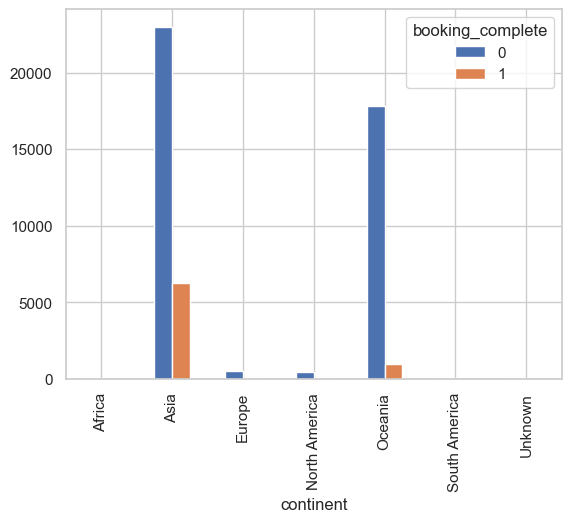

In [210]:
pd.crosstab(df1['continent'],df1['booking_complete']).plot(kind='bar')
# max completion of orders for asia followed by Oceania

In [221]:
country_counts = df1['booking_origin'].value_counts().reset_index()
country_counts.columns = ['booking_origin', 'count']

fig = px.choropleth(country_counts, 
                    locations="booking_origin", 
                    color="count",
                    locationmode="country names",
                    color_continuous_scale="Viridis",
                    title='Country-wise Booking Count',
                    labels={'count': 'Booking Count'})

# Show the plot
fig.show()

# Country wise booking completion in world Map

In [223]:
country_counts = df1.groupby(['booking_origin', 'booking_complete']).size().reset_index(name='count')

fig = px.choropleth(country_counts, 
                    locations="booking_origin", 
                    color="count",
                    locationmode="country names",
                    color_continuous_scale="plasma",
                    title='Country-wise Booking Count by Category',
                    labels={'count': 'Booking Count'},
                    facet_col="booking_complete",  # Use different colors for each category
                    facet_col_wrap=3)  # Adjust the number of columns in the facet grid

# Show the plot
fig.show()

# Now we will check the route with respect to target

In [226]:
df1['route'].value_counts()
# Akl - kulhas max count

AKLKUL    2620
PENTPE     912
MELSGN     833
ICNSIN     793
DMKKIX     729
          ... 
AKLHGH       1
JEDPDG       1
JEDPEN       1
DACPEK       1
MRUXIY       1
Name: route, Length: 799, dtype: int64

In [234]:
route_df = pd.crosstab(df1['route'],df1['booking_complete'],margins='index').sort_values(by ='All',ascending=False)
route_df.drop('All',inplace=True)

<AxesSubplot:xlabel='route'>

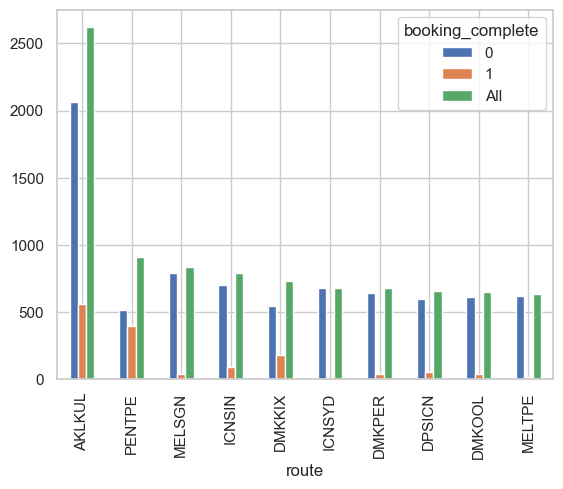

In [237]:
route_df[:10].plot(kind='bar')

In [242]:
route_df[route_df['All'] <=1]
# routes routes are just one entry 

booking_complete,0,1,All
route,,,
IKALOP,1,0,1
SGNXIY,1,0,1
BTUCKG,1,0,1
HDYHGH,1,0,1
HDYKTM,1,0,1
...,...,...,...
MRUTPE,1,0,1
MRUXIY,1,0,1
KBRXIY,1,0,1


In [246]:
df1['Origin'].value_counts()
# there are 85 unique origin locations
# most occuring is DMK,ICN
# URT,BTJ,CXR is of least count

DMK    3698
ICN    3681
MEL    3427
DPS    2840
AKL    2788
       ... 
CSX       4
NRT       2
CXR       1
BTJ       1
URT       1
Name: Origin, Length: 85, dtype: int64

<AxesSubplot:xlabel='Origin'>

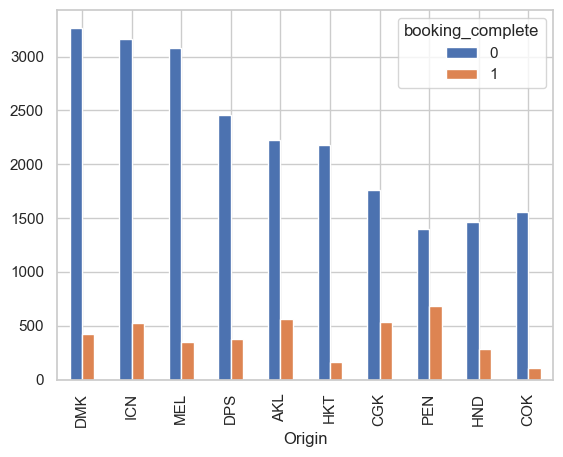

In [257]:
# top 10 Origin and Traget Ratio
pd.crosstab(df1['Origin'],df1['booking_complete'],margins=True).sort_values(by ='All',ascending=False)[[0,1]].drop('All')[:10].plot(kind='bar')


In [258]:
df1['Destination'].value_counts()
# most occuring is SYD followed by PER least are NRT,PDG,LBU

SYD    6543
PER    4940
MEL    4392
TPE    3989
OOL    2776
       ... 
SWA       3
NRT       1
PDG       1
LBU       1
SRG       1
Name: Destination, Length: 64, dtype: int64

<AxesSubplot:xlabel='Destination'>

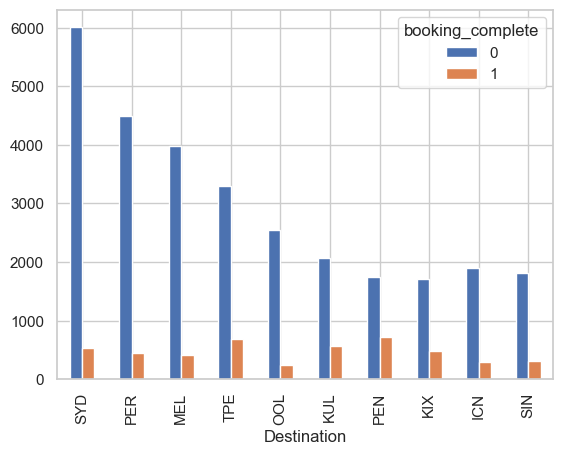

In [259]:
# Top 10 Destination by Traget Ratio
pd.crosstab(df1['Destination'],df1['booking_complete'],margins=True).sort_values(by ='All',ascending=False)[[0,1]].drop('All')[:10].plot(kind='bar')


In [260]:
# For this high cardinal we will use target encoding or catboost encoding

# Numerical Varaibles

In [261]:
df1.head()

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete,Origin,Destination,continent
0,2,Internet,RoundTrip,262,19,7,6,AKLDEL,New Zealand,1,0,0,5.52,0,AKL,DEL,Oceania
1,1,Internet,RoundTrip,112,20,3,6,AKLDEL,New Zealand,0,0,0,5.52,0,AKL,DEL,Oceania
2,2,Internet,RoundTrip,243,22,17,3,AKLDEL,India,1,1,0,5.52,0,AKL,DEL,Asia
3,1,Internet,RoundTrip,96,31,4,6,AKLDEL,New Zealand,0,0,1,5.52,0,AKL,DEL,Oceania
4,2,Internet,RoundTrip,68,22,15,3,AKLDEL,India,1,0,1,5.52,0,AKL,DEL,Asia


In [262]:
# Num of Passenegers

<AxesSubplot:xlabel='num_passengers', ylabel='Density'>

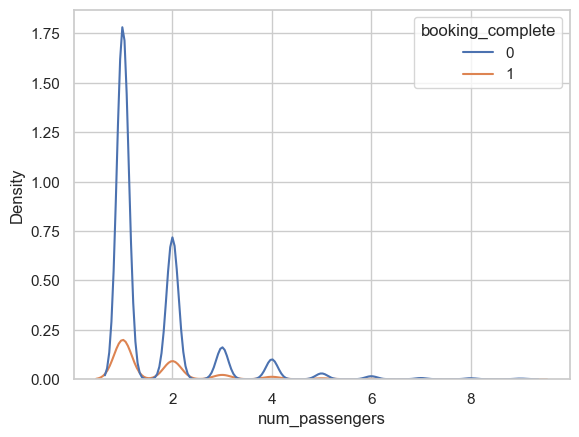

In [266]:
sns.kdeplot(df1['num_passengers'],hue=df1['booking_complete'])

<AxesSubplot:xlabel='booking_complete', ylabel='num_passengers'>

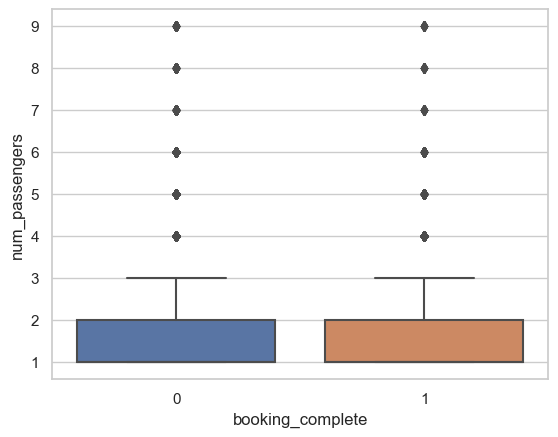

In [269]:
sns.boxplot(y = df1['num_passengers'],x=df1['booking_complete'])

<AxesSubplot:xlabel='num_passengers', ylabel='count'>

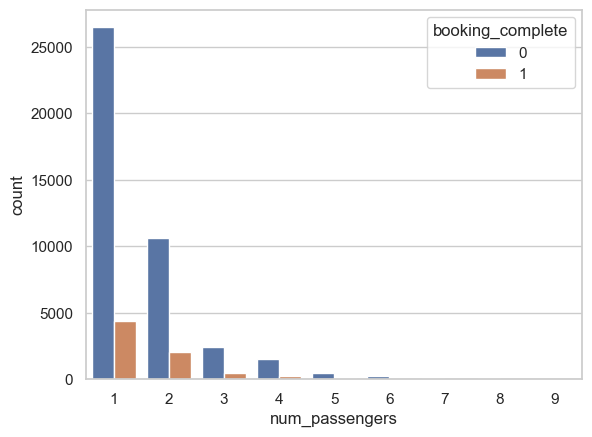

In [270]:
sns.countplot(df1['num_passengers'],hue=df1['booking_complete'])

In [271]:
# most orders are for 1 passenger

In [273]:
pd.crosstab(df1['num_passengers'],df1['booking_complete'])

booking_complete,0,1
num_passengers,,
1,26476,4403
2,10640,2029
3,2396,486
4,1494,273
5,438,106
6,228,53
7,91,16
8,76,12
9,51,13


In [276]:
pd.crosstab(df1['num_passengers'],df1['booking_complete'],normalize='index')
# the proportion of order completeion across diff number of passenegers is almost same

booking_complete,0,1
num_passengers,,
1,0.857411,0.142589
2,0.839845,0.160155
3,0.831367,0.168633
4,0.845501,0.154499
5,0.805147,0.194853
6,0.811388,0.188612
7,0.850467,0.149533
8,0.863636,0.136364
9,0.796875,0.203125


# Purchase Lead

<AxesSubplot:ylabel='Density'>

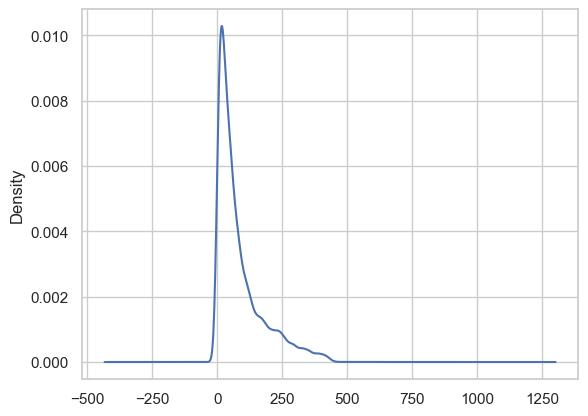

In [278]:

df1['purchase_lead'].plot(kind='kde')
# right skewed

<AxesSubplot:xlabel='purchase_lead', ylabel='Density'>

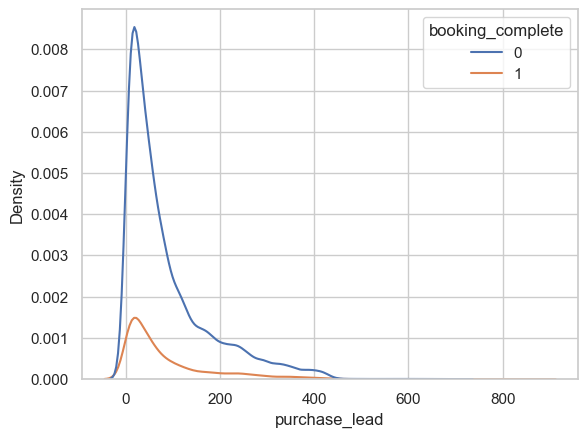

In [280]:
sns.kdeplot(df1['purchase_lead'],hue=df1['booking_complete'])

<AxesSubplot:xlabel='booking_complete', ylabel='purchase_lead'>

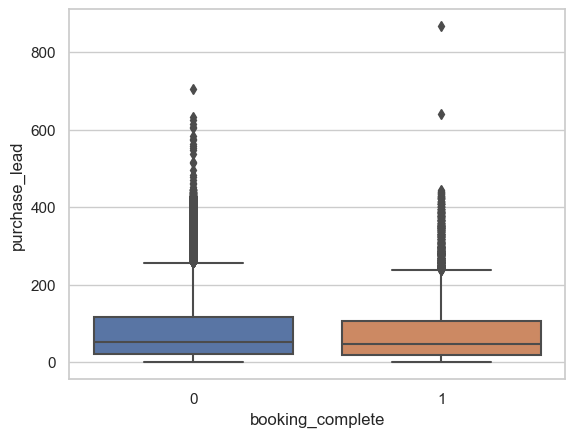

In [282]:
sns.boxplot(y=df1['purchase_lead'],x=df1['booking_complete'])

In [289]:
df1.groupby('booking_complete')['purchase_lead'].aggregate(['mean','median'])
# the avg purchase lead is less for  order completeion 

,mean,median
booking_complete,,
0,85.563762,52.0
1,79.959681,46.0


In [ ]:
# the distsribution is almost same

<AxesSubplot:xlabel='booking_complete', ylabel='purchase_lead'>

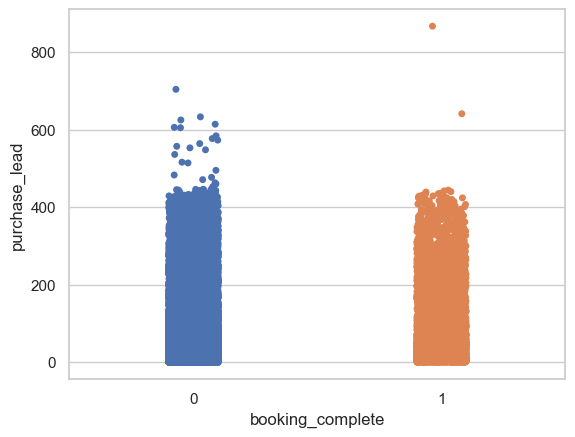

In [286]:
sns.stripplot(x = df1['booking_complete'],y=df1['purchase_lead'])
# there are some outliers other than purchase lead is almost same

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


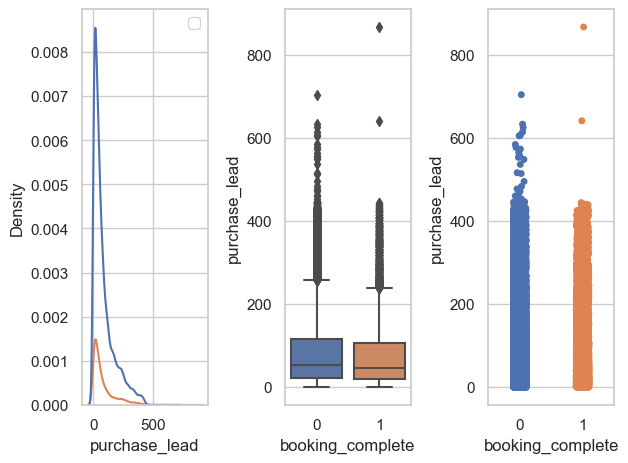

In [304]:
plt.subplot(1,3,1)
sns.kdeplot(df1['purchase_lead'],hue=df1['booking_complete'])
plt.legend(loc='upper right')

plt.subplot(1,3,2)
sns.boxplot(y=df1['purchase_lead'],x=df1['booking_complete'])

plt.subplot(1,3,3)
sns.stripplot(x = df1['booking_complete'],y=df1['purchase_lead'])

plt.tight_layout()

In [290]:
df1.head(2)

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete,Origin,Destination,continent
0,2,Internet,RoundTrip,262,19,7,6,AKLDEL,New Zealand,1,0,0,5.52,0,AKL,DEL,Oceania
1,1,Internet,RoundTrip,112,20,3,6,AKLDEL,New Zealand,0,0,0,5.52,0,AKL,DEL,Oceania


# length_of_stay

In [291]:
df1.groupby('booking_complete')['length_of_stay'].aggregate(['mean','median'])
# for order completion the length of stay is less than not completeion

,mean,median
booking_complete,,
0,23.651969,17.0
1,19.664727,6.0


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


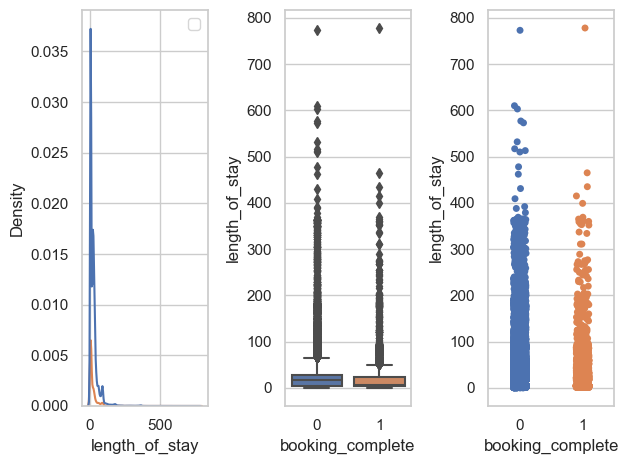

In [302]:
plt.subplot(1,3,1)
sns.kdeplot(df1['length_of_stay'],hue=df1['booking_complete'])
plt.legend(loc='upper right')

plt.subplot(1,3,2)
sns.boxplot(y=df1['length_of_stay'],x=df1['booking_complete'])

plt.subplot(1,3,3)
sns.stripplot(x = df1['booking_complete'],y=df1['length_of_stay'])

plt.tight_layout()

# flight duration

In [305]:
df1.groupby('booking_complete')['flight_duration'].aggregate(['mean','median'])
# for order completeion the avg is less than not completion

,mean,median
booking_complete,,
0,7.346932,7.57
1,6.900475,6.62


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


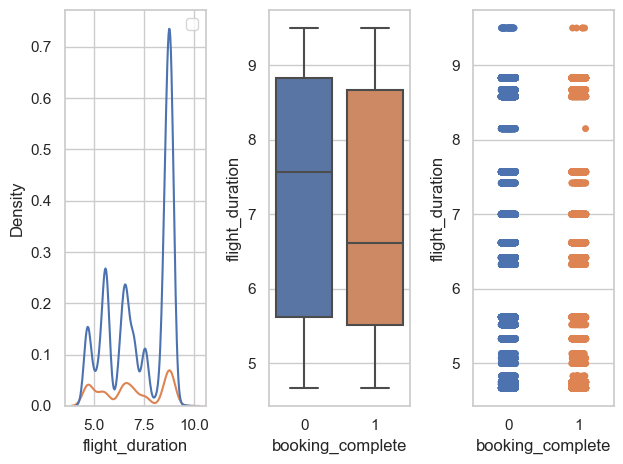

In [307]:
plt.subplot(1,3,1)
sns.kdeplot(df1['flight_duration'],hue=df1['booking_complete'])
plt.legend(loc='upper right')

plt.subplot(1,3,2)
sns.boxplot(x=df1['booking_complete'],y=df1['flight_duration'])

plt.subplot(1,3,3)
sns.stripplot(x = df1['booking_complete'],y=df1['flight_duration'])

plt.tight_layout()

In [308]:
# the overal distribution is similar in both cases bbut the average is less for complete 

In [ ]:
# we will check with in flight meals

In [309]:
df1.head(2)

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete,Origin,Destination,continent
0,2,Internet,RoundTrip,262,19,7,6,AKLDEL,New Zealand,1,0,0,5.52,0,AKL,DEL,Oceania
1,1,Internet,RoundTrip,112,20,3,6,AKLDEL,New Zealand,0,0,0,5.52,0,AKL,DEL,Oceania


In [310]:
df1.groupby('wants_in_flight_meals')['flight_duration'].mean()

wants_in_flight_meals
0    7.078311
1    7.550994
Name: flight_duration, dtype: float64

<AxesSubplot:xlabel='wants_in_flight_meals', ylabel='flight_duration'>

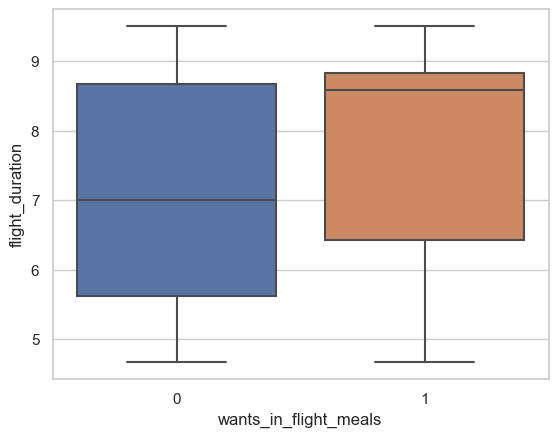

In [311]:
sns.boxplot(x= df1['wants_in_flight_meals'],y=df1['flight_duration'])
# the average duration is more when people opt for inflight meals

<AxesSubplot:xlabel='wants_in_flight_meals', ylabel='flight_duration'>

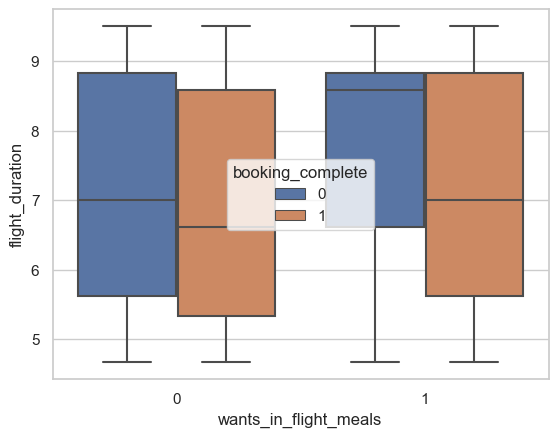

In [312]:
sns.boxplot(x= df1['wants_in_flight_meals'],y=df1['flight_duration'],hue=df1['booking_complete'])
## order completeion avearge with and without meals duration is almost similiar
## while not completed the avg differs

<AxesSubplot:xlabel='wants_preferred_seat', ylabel='flight_duration'>

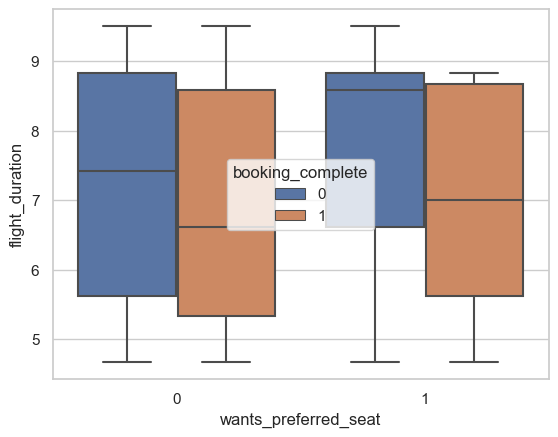

In [313]:
sns.boxplot(x= df1['wants_preferred_seat'],y=df1['flight_duration'],hue=df1['booking_complete'])
# same as meals preffered seat and order completion and not completeion duration are similar
# at higher duration not prefered not completed

<AxesSubplot:xlabel='wants_extra_baggage', ylabel='flight_duration'>

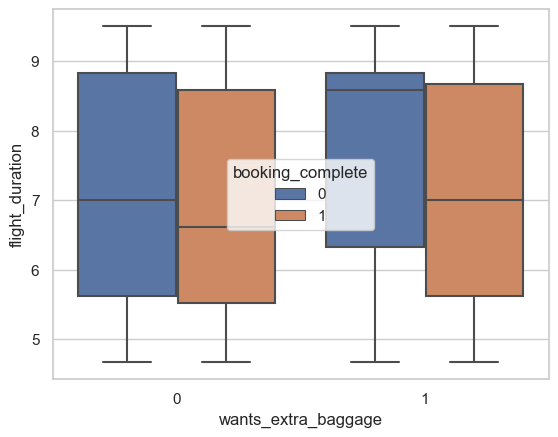

In [315]:
sns.boxplot(x= df1['wants_extra_baggage'],y=df1['flight_duration'],hue=df1['booking_complete'])
# same pattern people tend to not complete orders when for high duration flights in all cases

# combining all 4d in One plot

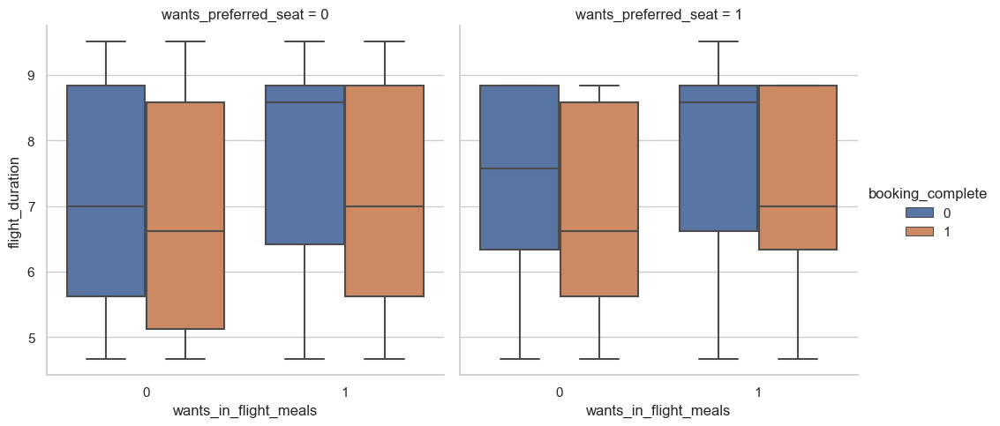

In [323]:
sns.catplot(data=df1,x = 'wants_in_flight_meals',y='flight_duration',hue='booking_complete',col='wants_preferred_seat'
           ,kind='box')

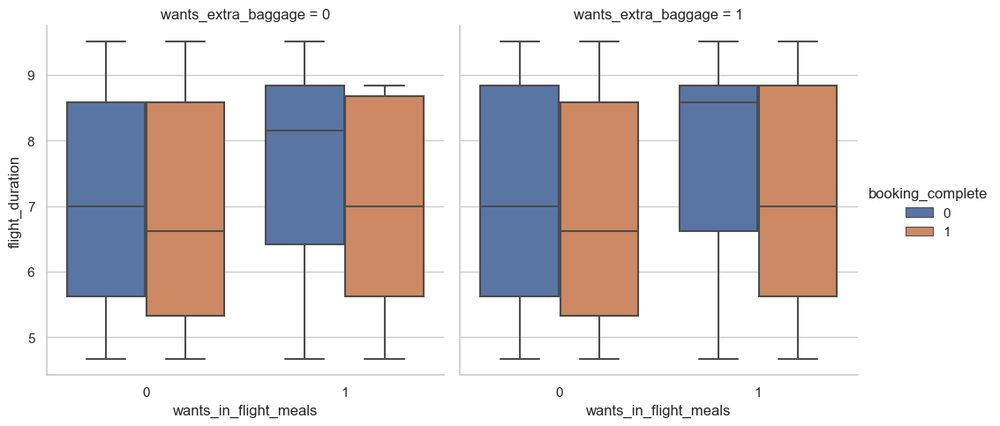

In [328]:
sns.catplot(data=df1,x = 'wants_in_flight_meals',y='flight_duration',hue='booking_complete'
           ,kind='box',col='wants_extra_baggage')

# combining all the above variable we can see the distribution are almost same

In [316]:
# we will check for meals,prefered sear=t , and baggage wrt Target

In [317]:
pd.crosstab(df1['wants_preferred_seat'],df1['booking_complete'])

booking_complete,0,1
wants_preferred_seat,,
0,29909,4803
1,11981,2588


In [318]:
pd.crosstab(df1['wants_preferred_seat'],df1['booking_complete'],normalize='index')


booking_complete,0,1
wants_preferred_seat,,
0,0.861633,0.138367
1,0.822363,0.177637


In [319]:
pd.crosstab(df1['wants_in_flight_meals'],df1['booking_complete'],normalize='index')


booking_complete,0,1
wants_in_flight_meals,,
0,0.858154,0.141846
1,0.839096,0.160904


In [320]:
pd.crosstab(df1['wants_extra_baggage'],df1['booking_complete'],normalize='index')


booking_complete,0,1
wants_extra_baggage,,
0,0.884709,0.115291
1,0.832802,0.167198


In [ ]:
# in all three cases the proportions across the categories for order completeionlies between 13 to 17 

<AxesSubplot:xlabel='wants_extra_baggage'>

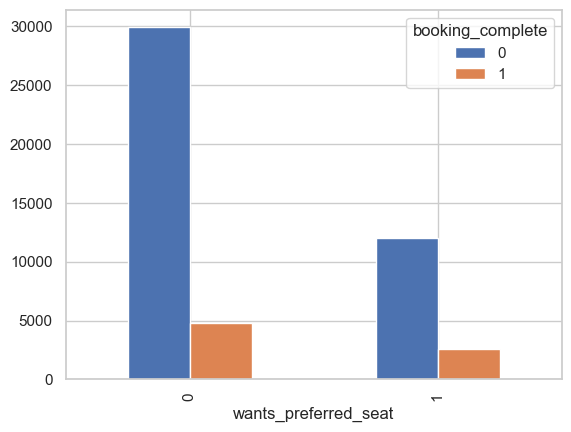

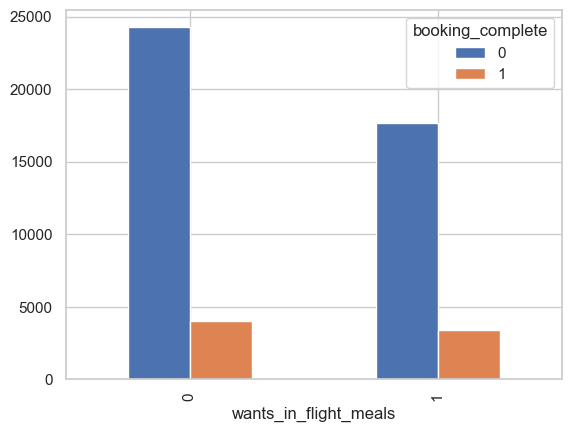

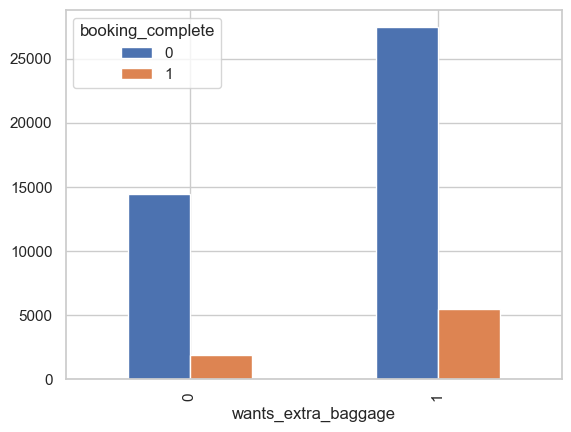

In [332]:

pd.crosstab(df1['wants_preferred_seat'],df1['booking_complete']).plot(kind='bar')
pd.crosstab(df1['wants_in_flight_meals'],df1['booking_complete']).plot(kind='bar')
pd.crosstab(df1['wants_extra_baggage'],df1['booking_complete']).plot(kind='bar')

# more people opt for extra baggage 
# very less number opt for preffered seat 

In [334]:
df1.head(3)

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete,Origin,Destination,continent
0,2,Internet,RoundTrip,262,19,7,6,AKLDEL,New Zealand,1,0,0,5.52,0,AKL,DEL,Oceania
1,1,Internet,RoundTrip,112,20,3,6,AKLDEL,New Zealand,0,0,0,5.52,0,AKL,DEL,Oceania
2,2,Internet,RoundTrip,243,22,17,3,AKLDEL,India,1,1,0,5.52,0,AKL,DEL,Asia


# From the EDA we have found that the data is imbalanced also the numeric variables are skewed. The proportion across catgeories for the target are alsmost similiar having 10-15% for the order completeion. Also the avg for numerical variables are less for the order completion but not big difference. Also while comparing multiple categorical and numerical variables together the proportions and average even though are diff for the two target class but is not so much different in magnitude. 

# Most  of the fetaures are not strong predictors for the target

# Data imbalance also needs to be treated

# Statistical Analysis for Feature Relations

# Kruskal Walis Test for Category vs Numeric

In [337]:
from scipy.stats import kruskal

In [335]:
df1

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete,Origin,Destination,continent
0,2,Internet,RoundTrip,262,19,7,6,AKLDEL,New Zealand,1,0,0,5.52,0,AKL,DEL,Oceania
1,1,Internet,RoundTrip,112,20,3,6,AKLDEL,New Zealand,0,0,0,5.52,0,AKL,DEL,Oceania
2,2,Internet,RoundTrip,243,22,17,3,AKLDEL,India,1,1,0,5.52,0,AKL,DEL,Asia
3,1,Internet,RoundTrip,96,31,4,6,AKLDEL,New Zealand,0,0,1,5.52,0,AKL,DEL,Oceania
4,2,Internet,RoundTrip,68,22,15,3,AKLDEL,India,1,0,1,5.52,0,AKL,DEL,Asia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,2,Internet,RoundTrip,27,6,9,6,PERPNH,Australia,1,0,1,5.62,0,PER,PNH,Oceania
49996,1,Internet,RoundTrip,111,6,4,7,PERPNH,Australia,0,0,0,5.62,0,PER,PNH,Oceania
49997,1,Internet,RoundTrip,24,6,22,6,PERPNH,Australia,0,0,1,5.62,0,PER,PNH,Oceania
49998,1,Internet,RoundTrip,15,6,11,1,PERPNH,Australia,1,0,1,5.62,0,PER,PNH,Oceania


In [339]:
df1.select_dtypes(include='number').columns

Index(['num_passengers', 'purchase_lead', 'length_of_stay', 'flight_duration'], dtype='object')

In [347]:
kruskal(df1[df1['booking_complete'] == 0]['purchase_lead'],df1[df1['booking_complete'] == 1]['purchase_lead'])

KruskalResult(statistic=55.72355844172983, pvalue=8.341267801870412e-14)

In [348]:
for i in ['purchase_lead', 'length_of_stay', 'flight_duration']:
    stat,p_val = kruskal(df1[df1['booking_complete'] == 0][i],df1[df1['booking_complete'] == 1][i])
    if p_val < 0.05:
        print(f'{i} is significant and depepends on Target ')
    else:
        print(f'{i} is not significant and independt of target')

purchase_lead is significant and depepends on Target 
length_of_stay is significant and depepends on Target 
flight_duration is significant and depepends on Target 


In [349]:
df1.select_dtypes(include=object).columns

Index(['sales_channel', 'trip_type', 'flight_hour', 'flight_day', 'route',
       'booking_origin', 'wants_extra_baggage', 'wants_preferred_seat',
       'wants_in_flight_meals', 'booking_complete', 'Origin', 'Destination',
       'continent'],
      dtype='object')

# Chi2 test of independence for Cat vs Cat


In [350]:
from scipy.stats import chi2_contingency

In [355]:
x,y,*z = chi2_contingency(pd.crosstab(df1['booking_complete'],df1['trip_type']))


[2,
 array([[9.86027069e+01, 3.28109008e+02, 4.14632883e+04],
        [1.73972931e+01, 5.78909925e+01, 7.31571171e+03]])]

In [359]:
for i in  ['sales_channel', 'trip_type', 'flight_hour', 'flight_day', 'route',
        'wants_extra_baggage', 'wants_preferred_seat',
       'wants_in_flight_meals',  'Origin', 'Destination',
       'continent','num_passengers']:
    
    stat,p_val,*z = chi2_contingency(pd.crosstab(df1['booking_complete'],df1[i]))
    if p_val < 0.05:
        print(f'{i} is significant and depepends on Target ')
    else:
        print(f'{i} is not significant and independt of target')


sales_channel is significant and depepends on Target 
trip_type is significant and depepends on Target 
flight_hour is significant and depepends on Target 
flight_day is significant and depepends on Target 
route is significant and depepends on Target 
wants_extra_baggage is significant and depepends on Target 
wants_preferred_seat is significant and depepends on Target 
wants_in_flight_meals is significant and depepends on Target 
Origin is significant and depepends on Target 
Destination is significant and depepends on Target 
continent is significant and depepends on Target 
num_passengers is significant and depepends on Target 


# Statstically all features are significant 

# Feature Encoding

## the fligt time will be encoded in cosine manner to capture the essence because we know that 24hr is close to 0 than to  20hr so to caputre this temporal pattern we will do cosine encoding

# we will drop booking origin and route as we have feature engineered other column for the same use 

# we will try target encoding for origin and destination and OHE for other categrorical features

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete,Origin,Destination,continent
0,2,Internet,RoundTrip,262,19,7,6,AKLDEL,New Zealand,1,0,0,5.52,0,AKL,DEL,Oceania
1,1,Internet,RoundTrip,112,20,3,6,AKLDEL,New Zealand,0,0,0,5.52,0,AKL,DEL,Oceania
2,2,Internet,RoundTrip,243,22,17,3,AKLDEL,India,1,1,0,5.52,0,AKL,DEL,Asia
3,1,Internet,RoundTrip,96,31,4,6,AKLDEL,New Zealand,0,0,1,5.52,0,AKL,DEL,Oceania
4,2,Internet,RoundTrip,68,22,15,3,AKLDEL,India,1,0,1,5.52,0,AKL,DEL,Asia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,2,Internet,RoundTrip,27,6,9,6,PERPNH,Australia,1,0,1,5.62,0,PER,PNH,Oceania
49996,1,Internet,RoundTrip,111,6,4,7,PERPNH,Australia,0,0,0,5.62,0,PER,PNH,Oceania
49997,1,Internet,RoundTrip,24,6,22,6,PERPNH,Australia,0,0,1,5.62,0,PER,PNH,Oceania
49998,1,Internet,RoundTrip,15,6,11,1,PERPNH,Australia,1,0,1,5.62,0,PER,PNH,Oceania


In [361]:
df2 = df1.copy()

In [362]:
df2.drop(columns=['booking_origin','route'],inplace=True)

In [363]:
df2

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete,Origin,Destination,continent
0,2,Internet,RoundTrip,262,19,7,6,1,0,0,5.52,0,AKL,DEL,Oceania
1,1,Internet,RoundTrip,112,20,3,6,0,0,0,5.52,0,AKL,DEL,Oceania
2,2,Internet,RoundTrip,243,22,17,3,1,1,0,5.52,0,AKL,DEL,Asia
3,1,Internet,RoundTrip,96,31,4,6,0,0,1,5.52,0,AKL,DEL,Oceania
4,2,Internet,RoundTrip,68,22,15,3,1,0,1,5.52,0,AKL,DEL,Asia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,2,Internet,RoundTrip,27,6,9,6,1,0,1,5.62,0,PER,PNH,Oceania
49996,1,Internet,RoundTrip,111,6,4,7,0,0,0,5.62,0,PER,PNH,Oceania
49997,1,Internet,RoundTrip,24,6,22,6,0,0,1,5.62,0,PER,PNH,Oceania
49998,1,Internet,RoundTrip,15,6,11,1,1,0,1,5.62,0,PER,PNH,Oceania


In [368]:
df2['flight_hour'] = df2['flight_hour'].astype(int)

In [370]:
df2['flight_hour']= np.cos(2 * np.pi * df2['flight_hour'] / 24)

<AxesSubplot:xlabel='flight_hour'>

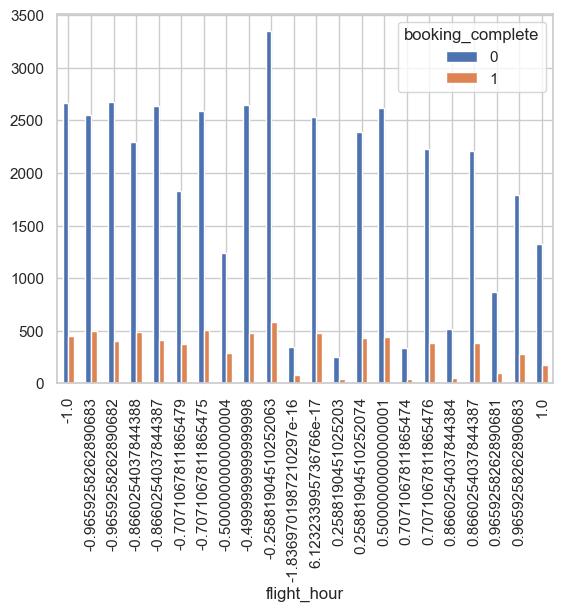

In [373]:
pd.crosstab(df2['flight_hour'],df1['booking_complete']).plot(kind='bar')

In [374]:
df2

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete,Origin,Destination,continent
0,2,Internet,RoundTrip,262,19,-0.258819,6,1,0,0,5.52,0,AKL,DEL,Oceania
1,1,Internet,RoundTrip,112,20,0.707107,6,0,0,0,5.52,0,AKL,DEL,Oceania
2,2,Internet,RoundTrip,243,22,-0.258819,3,1,1,0,5.52,0,AKL,DEL,Asia
3,1,Internet,RoundTrip,96,31,0.500000,6,0,0,1,5.52,0,AKL,DEL,Oceania
4,2,Internet,RoundTrip,68,22,-0.707107,3,1,0,1,5.52,0,AKL,DEL,Asia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,2,Internet,RoundTrip,27,6,-0.707107,6,1,0,1,5.62,0,PER,PNH,Oceania
49996,1,Internet,RoundTrip,111,6,0.500000,7,0,0,0,5.62,0,PER,PNH,Oceania
49997,1,Internet,RoundTrip,24,6,0.866025,6,0,0,1,5.62,0,PER,PNH,Oceania
49998,1,Internet,RoundTrip,15,6,-0.965926,1,1,0,1,5.62,0,PER,PNH,Oceania


In [488]:
df2['flight_day'] = df2['flight_day'].astype(object)

In [489]:
cat = df2[['sales_channel','trip_type','continent','flight_day']]
cat = pd.get_dummies(cat,drop_first=True)
df3 = pd.concat([df2,cat],axis=1).drop(columns = ['sales_channel','trip_type','continent','flight_day'])
df3

,num_passengers,purchase_lead,length_of_stay,flight_hour,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete,Origin,...,continent_North America,continent_Oceania,continent_South America,continent_Unknown,flight_day_2,flight_day_3,flight_day_4,flight_day_5,flight_day_6,flight_day_7
0,2,262,19,-0.258819,1,0,0,5.52,0,AKL,...,0,1,0,0,0,0,0,0,1,0
1,1,112,20,0.707107,0,0,0,5.52,0,AKL,...,0,1,0,0,0,0,0,0,1,0
2,2,243,22,-0.258819,1,1,0,5.52,0,AKL,...,0,0,0,0,0,1,0,0,0,0
3,1,96,31,0.500000,0,0,1,5.52,0,AKL,...,0,1,0,0,0,0,0,0,1,0
4,2,68,22,-0.707107,1,0,1,5.52,0,AKL,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,2,27,6,-0.707107,1,0,1,5.62,0,PER,...,0,1,0,0,0,0,0,0,1,0
49996,1,111,6,0.500000,0,0,0,5.62,0,PER,...,0,1,0,0,0,0,0,0,0,1
49997,1,24,6,0.866025,0,0,1,5.62,0,PER,...,0,1,0,0,0,0,0,0,1,0
49998,1,15,6,-0.965926,1,0,1,5.62,0,PER,...,0,1,0,0,0,0,0,0,0,0


In [386]:
df3.columns

Index(['num_passengers', 'purchase_lead', 'length_of_stay', 'flight_hour',
       'flight_day', 'wants_extra_baggage', 'wants_preferred_seat',
       'wants_in_flight_meals', 'flight_duration', 'booking_complete',
       'Origin', 'Destination', 'sales_channel_Mobile', 'trip_type_OneWay',
       'trip_type_RoundTrip', 'continent_Asia', 'continent_Europe',
       'continent_North America', 'continent_Oceania',
       'continent_South America', 'continent_Unknown'],
      dtype='object')

# We are using Catboost encoder from catgeory encoder it employs additional smoothening along frequency to prevent data leak. also we fit only train data

In [490]:
from category_encoders import CatBoostEncoder


In [491]:
X= df3.drop(columns='booking_complete')
y = df3['booking_complete']

In [492]:
xtrain,xtest,ytrain,ytest =train_test_split(X,y,random_state=10,train_size=0.80)

In [493]:
xtrain

,num_passengers,purchase_lead,length_of_stay,flight_hour,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,Origin,Destination,...,continent_North America,continent_Oceania,continent_South America,continent_Unknown,flight_day_2,flight_day_3,flight_day_4,flight_day_5,flight_day_6,flight_day_7
46301,1,53,6,-1.000000e+00,0,0,1,8.83,HKT,MEL,...,0,1,0,0,0,1,0,0,0,0
33018,1,75,4,-8.660254e-01,0,0,0,6.62,ICN,SUB,...,0,0,0,0,0,0,0,1,0,0
4983,2,130,31,8.660254e-01,1,0,1,8.83,CMB,MEL,...,0,1,0,0,0,0,0,1,0,0
9079,1,6,193,9.659258e-01,1,1,1,8.83,DMK,MEL,...,0,1,0,0,0,0,0,0,1,0
14098,1,45,22,-5.000000e-01,0,0,0,6.62,ICN,PER,...,0,1,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40602,1,65,5,7.071068e-01,0,0,0,5.33,LOP,PVG,...,0,0,0,0,0,0,0,0,0,0
28355,2,6,3,8.660254e-01,0,0,0,5.62,KCH,PER,...,0,0,0,0,0,0,0,0,1,0
29554,1,139,4,5.000000e-01,1,0,0,6.62,BKI,ICN,...,0,0,0,0,0,0,0,0,1,0
40604,2,304,5,-1.000000e+00,0,0,0,5.33,LOP,PVG,...,0,0,0,0,0,0,0,0,0,0


In [494]:
xtrain['Origin'].value_counts()

DMK    2980
ICN    2917
MEL    2736
DPS    2256
AKL    2233
       ... 
CSX       3
NRT       2
CXR       1
KWL       1
BTJ       1
Name: Origin, Length: 84, dtype: int64

In [495]:
catt =  CatBoostEncoder(cols=['Origin', 'Destination'])
catt.fit(xtrain,ytrain)
xtrain = pd.DataFrame(catt.transform(xtrain),columns=xtrain.columns)
xtest = pd.DataFrame(catt.transform(xtest),columns=xtest.columns)

In [441]:
xtrain['Origin'].value_counts()

0.116118    2980
0.138159    2917
0.098702    2736
0.128998    2256
0.201947    2233
            ... 
0.268580       7
0.191440       5
0.148640       3
0.037160       3
0.382880       2
Name: Origin, Length: 81, dtype: int64

In [442]:
xtrain['Destination'].value_counts()

0.078714    5235
0.090396    3961
0.094488    3546
0.171878    3194
0.086050    2232
            ... 
0.224903      13
0.012387      11
0.029728       4
0.148640       4
0.037160       3
Name: Destination, Length: 61, dtype: int64

In [496]:
xtrain

,num_passengers,purchase_lead,length_of_stay,flight_hour,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,Origin,Destination,...,continent_North America,continent_Oceania,continent_South America,continent_Unknown,flight_day_2,flight_day_3,flight_day_4,flight_day_5,flight_day_6,flight_day_7
46301,1,53,6,-1.000000e+00,0,0,1,8.83,0.072427,0.094488,...,0,1,0,0,0,1,0,0,0,0
33018,1,75,4,-8.660254e-01,0,0,0,6.62,0.138159,0.211048,...,0,0,0,0,0,0,0,1,0,0
4983,2,130,31,8.660254e-01,1,0,1,8.83,0.030389,0.094488,...,0,1,0,0,0,0,0,1,0,0
9079,1,6,193,9.659258e-01,1,1,1,8.83,0.116118,0.094488,...,0,1,0,0,0,0,0,0,1,0
14098,1,45,22,-5.000000e-01,0,0,0,6.62,0.138159,0.090396,...,0,1,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40602,1,65,5,7.071068e-01,0,0,0,5.33,0.093663,0.222525,...,0,0,0,0,0,0,0,0,0,0
28355,2,6,3,8.660254e-01,0,0,0,5.62,0.243553,0.090396,...,0,0,0,0,0,0,0,0,1,0
29554,1,139,4,5.000000e-01,1,0,0,6.62,0.283744,0.129651,...,0,0,0,0,0,0,0,0,1,0
40604,2,304,5,-1.000000e+00,0,0,0,5.33,0.093663,0.222525,...,0,0,0,0,0,0,0,0,0,0


# Model Selection 
# We try model selection using Pycaret 
# As both FP and FN can be costly here we can focuss on F1 score

In [497]:
ytrain

46301    0
33018    0
4983     0
9079     0
14098    0
        ..
40602    0
28355    1
29554    0
40604    0
17899    0
Name: booking_complete, Length: 39424, dtype: object

In [498]:
df_train = pd.concat([xtrain,ytrain],axis=1)

In [499]:
df_train['booking_complete'].value_counts(normalize=True)

0    0.85136
1    0.14864
Name: booking_complete, dtype: float64

In [500]:
for i in df_train.columns:
    df_train[i] = df_train[i].astype(float)

In [449]:
from pycaret.classification import *

In [454]:
setup(data=df_train,target='booking_complete',remove_multicollinearity=True,preprocess=True)

,Description,Value
0,Session id,6174
1,Target,booking_complete
2,Target type,Binary
3,Original data shape,"(39424, 21)"
4,Transformed data shape,"(39424, 21)"
5,Transformed train set shape,"(27596, 21)"
6,Transformed test set shape,"(11828, 21)"
7,Numeric features,20
8,Preprocess,True
9,Imputation type,simple


In [455]:
models = compare_models(fold=3)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.8520,0.7681,0.0353,0.5331,0.0663,0.0486,0.1077,1.4700
ridge,Ridge Classifier,0.8514,0.0000,0.0005,0.5000,0.0010,0.0007,0.0117,0.1467
dummy,Dummy Classifier,0.8514,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.1200
lightgbm,Light Gradient Boosting Machine,0.8510,0.7718,0.0683,0.4926,0.1198,0.0867,0.1400,0.3400
catboost,CatBoost Classifier,0.8505,0.7702,0.0892,0.4860,0.1506,0.1095,0.1586,5.8033
lr,Logistic Regression,0.8498,0.7518,0.0300,0.4243,0.0560,0.0371,0.0798,5.7000
lda,Linear Discriminant Analysis,0.8490,0.7510,0.0524,0.4337,0.0935,0.0635,0.1084,0.1533
ada,Ada Boost Classifier,0.8489,0.7587,0.0344,0.4056,0.0632,0.0409,0.0812,0.6300
rf,Random Forest Classifier,0.8473,0.7545,0.0917,0.4351,0.1514,0.1051,0.1447,0.6800
xgboost,Extreme Gradient Boosting,0.8444,0.7586,0.1316,0.4246,0.2009,0.1404,0.1704,1.4567


Processing:   0%|          | 0/69 [00:00<?, ?it/s]

# we will try diff Resampling techniques to treat Imbalance

In [ ]:
# Oversampling

In [458]:
setup(data=df_train,target='booking_complete',remove_multicollinearity=True,preprocess=True,fix_imbalance=True,
     fix_imbalance_method='randomoversampler')

,Description,Value
0,Session id,2832
1,Target,booking_complete
2,Target type,Binary
3,Original data shape,"(39424, 21)"
4,Transformed data shape,"(58816, 21)"
5,Transformed train set shape,"(46988, 21)"
6,Transformed test set shape,"(11828, 21)"
7,Numeric features,20
8,Preprocess,True
9,Imputation type,simple


In [459]:
models = compare_models(fold=3)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
dummy,Dummy Classifier,0.8514,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.1500
et,Extra Trees Classifier,0.8453,0.7372,0.1192,0.4273,0.1863,0.1299,0.1629,0.8167
rf,Random Forest Classifier,0.8375,0.7572,0.2199,0.4129,0.2869,0.2048,0.2178,0.9700
dt,Decision Tree Classifier,0.7826,0.5717,0.2716,0.2701,0.2708,0.1431,0.1431,3.0500
xgboost,Extreme Gradient Boosting,0.7520,0.7500,0.5722,0.3158,0.4069,0.2664,0.2852,2.3500
catboost,CatBoost Classifier,0.7460,0.7657,0.6175,0.3178,0.4196,0.2779,0.3030,7.1067
lightgbm,Light Gradient Boosting Machine,0.7175,0.7733,0.6865,0.3020,0.4194,0.2683,0.3079,0.4133
gbc,Gradient Boosting Classifier,0.6966,0.7712,0.7274,0.2915,0.4162,0.2589,0.3083,2.4000
ada,Ada Boost Classifier,0.6753,0.7578,0.7260,0.2754,0.3993,0.2342,0.2860,0.9167
lr,Logistic Regression,0.6734,0.7531,0.7304,0.2749,0.3994,0.2339,0.2866,5.3133


Processing:   0%|          | 0/69 [00:00<?, ?it/s]

In [460]:
#undersampling 
setup(data=df_train,target='booking_complete',remove_multicollinearity=True,preprocess=True,fix_imbalance=True,
     fix_imbalance_method='randomundersampler')

,Description,Value
0,Session id,4071
1,Target,booking_complete
2,Target type,Binary
3,Original data shape,"(39424, 21)"
4,Transformed data shape,"(20032, 21)"
5,Transformed train set shape,"(8204, 21)"
6,Transformed test set shape,"(11828, 21)"
7,Numeric features,20
8,Preprocess,True
9,Imputation type,simple


In [461]:
models = compare_models(fold=3)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
dummy,Dummy Classifier,0.8514,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.1267
rf,Random Forest Classifier,0.6821,0.7559,0.7143,0.2783,0.4005,0.2373,0.2862,0.4000
gbc,Gradient Boosting Classifier,0.6784,0.7651,0.7401,0.2801,0.4063,0.2431,0.2971,0.5700
lightgbm,Light Gradient Boosting Machine,0.6748,0.7620,0.7399,0.2775,0.4036,0.2390,0.2934,0.3300
catboost,CatBoost Classifier,0.6738,0.7630,0.7406,0.2770,0.4031,0.2383,0.2929,2.0067
xgboost,Extreme Gradient Boosting,0.6693,0.7454,0.7006,0.2669,0.3865,0.2182,0.2658,0.5367
et,Extra Trees Classifier,0.6675,0.7432,0.7019,0.2658,0.3856,0.2167,0.2647,0.4400
ada,Ada Boost Classifier,0.6667,0.7538,0.7355,0.2711,0.3961,0.2285,0.2829,0.3533
ridge,Ridge Classifier,0.6586,0.0000,0.7421,0.2669,0.3926,0.2226,0.2790,0.1300
lda,Linear Discriminant Analysis,0.6574,0.7501,0.7365,0.2652,0.3899,0.2193,0.2747,0.1467


Processing:   0%|          | 0/69 [00:00<?, ?it/s]

In [462]:
#smote 
setup(data=df_train,target='booking_complete',remove_multicollinearity=True,preprocess=True,fix_imbalance=True,
     fix_imbalance_method='smote')

,Description,Value
0,Session id,4026
1,Target,booking_complete
2,Target type,Binary
3,Original data shape,"(39424, 21)"
4,Transformed data shape,"(58816, 21)"
5,Transformed train set shape,"(46988, 21)"
6,Transformed test set shape,"(11828, 21)"
7,Numeric features,20
8,Preprocess,True
9,Imputation type,simple


In [463]:
models = compare_models(fold=3)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
dummy,Dummy Classifier,0.8514,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.1700
lightgbm,Light Gradient Boosting Machine,0.8491,0.7719,0.1063,0.4676,0.1731,0.1249,0.1675,0.5933
catboost,CatBoost Classifier,0.8473,0.7700,0.1058,0.4422,0.1707,0.1203,0.1585,8.2867
xgboost,Extreme Gradient Boosting,0.8433,0.7624,0.1277,0.4129,0.1950,0.1343,0.1630,3.3667
rf,Random Forest Classifier,0.8415,0.7545,0.1431,0.4057,0.2116,0.1453,0.1700,1.2600
et,Extra Trees Classifier,0.8378,0.7429,0.1663,0.3918,0.2334,0.1590,0.1774,1.0567
gbc,Gradient Boosting Classifier,0.8333,0.7512,0.1824,0.3745,0.2450,0.1639,0.1774,5.1767
ada,Ada Boost Classifier,0.8058,0.7261,0.2842,0.3251,0.3032,0.1910,0.1916,1.4900
dt,Decision Tree Classifier,0.7682,0.5783,0.3074,0.2618,0.2827,0.1456,0.1463,0.3767
lr,Logistic Regression,0.6692,0.7494,0.7245,0.2709,0.3943,0.2271,0.2792,1.2433


Processing:   0%|          | 0/69 [00:00<?, ?it/s]

# we are getting similiar results for all 3 sampling techniques for smote log reg has max f1 score but still low
# we will try PCA,Polynomial etc

In [464]:
setup(data=df_train,target='booking_complete',remove_multicollinearity=True,preprocess=True,fix_imbalance=True,
     fix_imbalance_method='smote',polynomial_degree=True)

,Description,Value
0,Session id,3833
1,Target,booking_complete
2,Target type,Binary
3,Original data shape,"(39424, 21)"
4,Transformed data shape,"(58816, 21)"
5,Transformed train set shape,"(46988, 21)"
6,Transformed test set shape,"(11828, 21)"
7,Numeric features,20
8,Preprocess,True
9,Imputation type,simple


In [465]:
models = compare_models(fold=3)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
dummy,Dummy Classifier,0.8514,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.1800
lightgbm,Light Gradient Boosting Machine,0.8466,0.7721,0.1078,0.4353,0.1727,0.1209,0.1575,0.6267
catboost,CatBoost Classifier,0.8453,0.7684,0.1117,0.4230,0.1767,0.1221,0.1558,8.6433
xgboost,Extreme Gradient Boosting,0.8422,0.7593,0.1297,0.4033,0.1962,0.1336,0.1604,3.3767
rf,Random Forest Classifier,0.8397,0.7539,0.1477,0.3954,0.2150,0.1459,0.1681,1.3667
et,Extra Trees Classifier,0.8342,0.7412,0.1616,0.3687,0.2247,0.1474,0.1633,0.9867
gbc,Gradient Boosting Classifier,0.8322,0.7528,0.1965,0.3773,0.2581,0.1740,0.1859,5.2100
ada,Ada Boost Classifier,0.8088,0.7287,0.2928,0.3363,0.3127,0.2024,0.2032,1.5000
dt,Decision Tree Classifier,0.7647,0.5745,0.3038,0.2554,0.2774,0.1382,0.1389,0.3100
lr,Logistic Regression,0.6706,0.7525,0.7226,0.2715,0.3947,0.2278,0.2794,1.3533


Processing:   0%|          | 0/69 [00:00<?, ?it/s]

In [468]:
setup(data=df_train,target='booking_complete',remove_multicollinearity=True,preprocess=True,fix_imbalance=True,
     fix_imbalance_method='smote',polynomial_degree=True,polynomial_features=5)


,Description,Value
0,Session id,944
1,Target,booking_complete
2,Target type,Binary
3,Original data shape,"(39424, 21)"
4,Transformed data shape,"(58816, 21)"
5,Transformed train set shape,"(46988, 21)"
6,Transformed test set shape,"(11828, 21)"
7,Numeric features,20
8,Preprocess,True
9,Imputation type,simple


In [469]:
models = ['catboost','rf','dt','lr','xgboost','gbc','nb','knn','ada']
compare_models(include=models,fold=3)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.8471,0.7672,0.1158,0.4468,0.1837,0.1304,0.1674,8.6800
xgboost,Extreme Gradient Boosting,0.8448,0.7583,0.1329,0.4294,0.2029,0.1426,0.1732,3.4200
rf,Random Forest Classifier,0.8406,0.7512,0.1514,0.4049,0.2202,0.1514,0.1745,1.2933
gbc,Gradient Boosting Classifier,0.8308,0.7542,0.2140,0.3779,0.2733,0.1857,0.1954,5.2133
ada,Ada Boost Classifier,0.8099,0.7319,0.2884,0.3368,0.3098,0.2007,0.2019,1.4900
dt,Decision Tree Classifier,0.7659,0.5830,0.3225,0.2642,0.2905,0.1519,0.1530,0.3300
lr,Logistic Regression,0.6747,0.7537,0.7231,0.2745,0.3979,0.2325,0.2837,1.2767
knn,K Neighbors Classifier,0.5996,0.5825,0.5098,0.1879,0.2746,0.0733,0.0907,2.4300
nb,Naive Bayes,0.5067,0.7282,0.8567,0.2125,0.3405,0.1342,0.2194,0.2033


Processing:   0%|          | 0/41 [00:00<?, ?it/s]

In [471]:
setup(data=df_train,target='booking_complete',remove_multicollinearity=True,preprocess=True,fix_imbalance=True,
     fix_imbalance_method='smote',polynomial_degree=True,polynomial_features=5,pca=True,pca_components=0.90)


,Description,Value
0,Session id,2691
1,Target,booking_complete
2,Target type,Binary
3,Original data shape,"(39424, 21)"
4,Transformed data shape,"(58816, 3)"
5,Transformed train set shape,"(46988, 3)"
6,Transformed test set shape,"(11828, 3)"
7,Numeric features,20
8,Preprocess,True
9,Imputation type,simple


In [472]:
models = ['catboost','rf','dt','lr','xgboost','gbc','nb','knn','ada']
compare_models(include=models,fold=3)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.7294,0.5405,0.2167,0.1728,0.1922,0.0322,0.0325,5.9833
dt,Decision Tree Classifier,0.7096,0.5192,0.2484,0.1713,0.2027,0.0325,0.0333,3.0767
knn,K Neighbors Classifier,0.6715,0.5270,0.2784,0.1575,0.2011,0.0140,0.0150,0.4000
xgboost,Extreme Gradient Boosting,0.6642,0.5663,0.3842,0.1895,0.2538,0.0683,0.0755,1.5400
catboost,CatBoost Classifier,0.6266,0.5717,0.4408,0.1840,0.2596,0.0632,0.0742,6.4500
gbc,Gradient Boosting Classifier,0.5545,0.5950,0.6219,0.1919,0.2933,0.0856,0.1172,2.6900
ada,Ada Boost Classifier,0.5339,0.5886,0.6470,0.1886,0.2920,0.0804,0.1147,0.9667
lr,Logistic Regression,0.4626,0.5662,0.6655,0.1686,0.2691,0.0418,0.0670,2.9500
nb,Naive Bayes,0.3135,0.5603,0.8089,0.1546,0.2594,0.0132,0.0308,0.2267


Processing:   0%|          | 0/41 [00:00<?, ?it/s]

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=-1, oob_score=False,
                       random_state=2691, verbose=0, warm_start=False)

In [473]:
setup(data=df_train,target='booking_complete',remove_multicollinearity=True,preprocess=True,fix_imbalance=True,
     fix_imbalance_method='smote',pca=True,pca_components=0.90)


,Description,Value
0,Session id,957
1,Target,booking_complete
2,Target type,Binary
3,Original data shape,"(39424, 21)"
4,Transformed data shape,"(58816, 3)"
5,Transformed train set shape,"(46988, 3)"
6,Transformed test set shape,"(11828, 3)"
7,Numeric features,20
8,Preprocess,True
9,Imputation type,simple


In [474]:
models = ['catboost','rf','dt','lr','xgboost','gbc','nb','knn','ada']
compare_models(include=models,fold=3)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.7331,0.5451,0.2318,0.1841,0.2052,0.0474,0.0478,2.0167
dt,Decision Tree Classifier,0.7097,0.5223,0.2557,0.1747,0.2076,0.0375,0.0385,0.3233
knn,K Neighbors Classifier,0.6765,0.5301,0.2894,0.1649,0.2101,0.0255,0.0271,0.4400
xgboost,Extreme Gradient Boosting,0.6602,0.5621,0.3827,0.1865,0.2508,0.0637,0.0706,1.5500
catboost,CatBoost Classifier,0.6234,0.5693,0.4456,0.1838,0.2602,0.0631,0.0742,6.9733
gbc,Gradient Boosting Classifier,0.5499,0.5907,0.6177,0.1893,0.2898,0.0806,0.1109,2.6400
ada,Ada Boost Classifier,0.5280,0.5897,0.6475,0.1867,0.2897,0.0767,0.1102,0.9767
nb,Naive Bayes,0.5278,0.5541,0.5588,0.1707,0.2596,0.0427,0.0588,0.1967
lr,Logistic Regression,0.4523,0.5561,0.6563,0.1642,0.2627,0.0326,0.0529,0.2200


Processing:   0%|          | 0/41 [00:00<?, ?it/s]

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=-1, oob_score=False,
                       random_state=957, verbose=0, warm_start=False)

In [476]:
df_train['flight_day'] = df_train['flight_day'].astype(object)
df_train = pd.get_dummies(df_train,drop_first=True)

In [477]:
df_train

,num_passengers,purchase_lead,length_of_stay,flight_hour,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,Origin,Destination,...,continent_Oceania,continent_South America,continent_Unknown,booking_complete,flight_day_2.0,flight_day_3.0,flight_day_4.0,flight_day_5.0,flight_day_6.0,flight_day_7.0
46301,1.0,53.0,6.0,-1.000000e+00,0.0,0.0,1.0,8.83,0.072427,0.094488,...,1.0,0.0,0.0,0.0,0,1,0,0,0,0
33018,1.0,75.0,4.0,-8.660254e-01,0.0,0.0,0.0,6.62,0.138159,0.211048,...,0.0,0.0,0.0,0.0,0,0,0,1,0,0
4983,2.0,130.0,31.0,8.660254e-01,1.0,0.0,1.0,8.83,0.030389,0.094488,...,1.0,0.0,0.0,0.0,0,0,0,1,0,0
9079,1.0,6.0,193.0,9.659258e-01,1.0,1.0,1.0,8.83,0.116118,0.094488,...,1.0,0.0,0.0,0.0,0,0,0,0,1,0
14098,1.0,45.0,22.0,-5.000000e-01,0.0,0.0,0.0,6.62,0.138159,0.090396,...,1.0,0.0,0.0,0.0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40602,1.0,65.0,5.0,7.071068e-01,0.0,0.0,0.0,5.33,0.093663,0.222525,...,0.0,0.0,0.0,0.0,0,0,0,0,0,0
28355,2.0,6.0,3.0,8.660254e-01,0.0,0.0,0.0,5.62,0.243553,0.090396,...,0.0,0.0,0.0,1.0,0,0,0,0,1,0
29554,1.0,139.0,4.0,5.000000e-01,1.0,0.0,0.0,6.62,0.283744,0.129651,...,0.0,0.0,0.0,0.0,0,0,0,0,1,0
40604,2.0,304.0,5.0,-1.000000e+00,0.0,0.0,0.0,5.33,0.093663,0.222525,...,0.0,0.0,0.0,0.0,0,0,0,0,0,0


In [478]:
setup(data=df_train,target='booking_complete',remove_multicollinearity=True,preprocess=True,fix_imbalance=True,
     fix_imbalance_method='smote',)


,Description,Value
0,Session id,6399
1,Target,booking_complete
2,Target type,Binary
3,Original data shape,"(39424, 26)"
4,Transformed data shape,"(58816, 26)"
5,Transformed train set shape,"(46988, 26)"
6,Transformed test set shape,"(11828, 26)"
7,Numeric features,25
8,Preprocess,True
9,Imputation type,simple


In [480]:
models = ['catboost','rf','dt','lr','xgboost','gbc','nb','knn','ada']
compare_models(include=models,fold=2)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.8450,0.7570,0.0970,0.4089,0.1567,0.1059,0.1399,16.2850
rf,Random Forest Classifier,0.8423,0.7365,0.1024,0.3854,0.1617,0.1059,0.1349,5.3700
xgboost,Extreme Gradient Boosting,0.8408,0.7458,0.1275,0.3923,0.1922,0.1287,0.1541,8.1450
gbc,Gradient Boosting Classifier,0.8396,0.7460,0.1277,0.3819,0.1914,0.1263,0.1499,10.4400
ada,Ada Boost Classifier,0.8213,0.7179,0.1867,0.3237,0.2364,0.1437,0.1508,1.7600
dt,Decision Tree Classifier,0.7669,0.5747,0.3011,0.2572,0.2774,0.1395,0.1401,3.8850
lr,Logistic Regression,0.6622,0.7448,0.7265,0.2668,0.3901,0.2206,0.2737,6.4600
knn,K Neighbors Classifier,0.5863,0.5756,0.5210,0.1844,0.2724,0.0677,0.0856,4.5250
nb,Naive Bayes,0.5229,0.7141,0.8406,0.2161,0.3438,0.1405,0.2218,0.3900


Processing:   0%|          | 0/41 [00:00<?, ?it/s]

In [483]:
setup(data=df_train,target='booking_complete',remove_multicollinearity=True,preprocess=True,fix_imbalance=True,
     fix_imbalance_method='randomundersampler',)


,Description,Value
0,Session id,1546
1,Target,booking_complete
2,Target type,Binary
3,Original data shape,"(39424, 26)"
4,Transformed data shape,"(20032, 26)"
5,Transformed train set shape,"(8204, 26)"
6,Transformed test set shape,"(11828, 26)"
7,Numeric features,25
8,Preprocess,True
9,Imputation type,simple


In [484]:
models = ['catboost','rf','dt','lr','xgboost','gbc','nb','knn','ada']
compare_models(include=models,fold=2)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.6827,0.7611,0.7228,0.2799,0.4035,0.2409,0.2915,0.8000
catboost,CatBoost Classifier,0.6784,0.7587,0.7253,0.2774,0.4011,0.2371,0.2888,3.8350
rf,Random Forest Classifier,0.6780,0.7451,0.7016,0.2731,0.3930,0.2278,0.2750,0.6800
xgboost,Extreme Gradient Boosting,0.6673,0.7343,0.6826,0.2621,0.3787,0.2088,0.2536,1.0150
ada,Ada Boost Classifier,0.6519,0.7463,0.7321,0.2609,0.3846,0.2119,0.2671,0.5250
lr,Logistic Regression,0.6503,0.7455,0.7423,0.2616,0.3868,0.2141,0.2713,0.5450
dt,Decision Tree Classifier,0.6177,0.6053,0.5875,0.2139,0.3136,0.1223,0.1524,0.2100
knn,K Neighbors Classifier,0.5514,0.5849,0.5863,0.1838,0.2798,0.0691,0.0938,1.1500
nb,Naive Bayes,0.5346,0.7296,0.8118,0.2296,0.3515,0.1555,0.2263,0.2350


Processing:   0%|          | 0/41 [00:00<?, ?it/s]

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='log_loss', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=100, n_iter_no_change=None,
                           random_state=1546, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [485]:
# we will build a logistic regression model with smote and then work on

In [486]:
from sklearn.linear_model import LogisticRegression

In [501]:
xtrain

,num_passengers,purchase_lead,length_of_stay,flight_hour,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,Origin,Destination,...,continent_North America,continent_Oceania,continent_South America,continent_Unknown,flight_day_2,flight_day_3,flight_day_4,flight_day_5,flight_day_6,flight_day_7
46301,1,53,6,-1.000000e+00,0,0,1,8.83,0.072427,0.094488,...,0,1,0,0,0,1,0,0,0,0
33018,1,75,4,-8.660254e-01,0,0,0,6.62,0.138159,0.211048,...,0,0,0,0,0,0,0,1,0,0
4983,2,130,31,8.660254e-01,1,0,1,8.83,0.030389,0.094488,...,0,1,0,0,0,0,0,1,0,0
9079,1,6,193,9.659258e-01,1,1,1,8.83,0.116118,0.094488,...,0,1,0,0,0,0,0,0,1,0
14098,1,45,22,-5.000000e-01,0,0,0,6.62,0.138159,0.090396,...,0,1,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40602,1,65,5,7.071068e-01,0,0,0,5.33,0.093663,0.222525,...,0,0,0,0,0,0,0,0,0,0
28355,2,6,3,8.660254e-01,0,0,0,5.62,0.243553,0.090396,...,0,0,0,0,0,0,0,0,1,0
29554,1,139,4,5.000000e-01,1,0,0,6.62,0.283744,0.129651,...,0,0,0,0,0,0,0,0,1,0
40604,2,304,5,-1.000000e+00,0,0,0,5.33,0.093663,0.222525,...,0,0,0,0,0,0,0,0,0,0


In [502]:
from sklearn.metrics import *

In [504]:
xtrain

,num_passengers,purchase_lead,length_of_stay,flight_hour,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,Origin,Destination,...,continent_North America,continent_Oceania,continent_South America,continent_Unknown,flight_day_2,flight_day_3,flight_day_4,flight_day_5,flight_day_6,flight_day_7
46301,1,53,6,-1.000000e+00,0,0,1,8.83,0.072427,0.094488,...,0,1,0,0,0,1,0,0,0,0
33018,1,75,4,-8.660254e-01,0,0,0,6.62,0.138159,0.211048,...,0,0,0,0,0,0,0,1,0,0
4983,2,130,31,8.660254e-01,1,0,1,8.83,0.030389,0.094488,...,0,1,0,0,0,0,0,1,0,0
9079,1,6,193,9.659258e-01,1,1,1,8.83,0.116118,0.094488,...,0,1,0,0,0,0,0,0,1,0
14098,1,45,22,-5.000000e-01,0,0,0,6.62,0.138159,0.090396,...,0,1,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40602,1,65,5,7.071068e-01,0,0,0,5.33,0.093663,0.222525,...,0,0,0,0,0,0,0,0,0,0
28355,2,6,3,8.660254e-01,0,0,0,5.62,0.243553,0.090396,...,0,0,0,0,0,0,0,0,1,0
29554,1,139,4,5.000000e-01,1,0,0,6.62,0.283744,0.129651,...,0,0,0,0,0,0,0,0,1,0
40604,2,304,5,-1.000000e+00,0,0,0,5.33,0.093663,0.222525,...,0,0,0,0,0,0,0,0,0,0


In [517]:
xtrain.info()

for i in xtrain.columns:
    xtrain[i] = xtrain[i].astype(float)
ytrain = ytrain.astype(float)
ytest = ytest.astype(float)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39424 entries, 46301 to 17899
Data columns (total 25 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   num_passengers           39424 non-null  float64
 1   purchase_lead            39424 non-null  float64
 2   length_of_stay           39424 non-null  float64
 3   flight_hour              39424 non-null  float64
 4   wants_extra_baggage      39424 non-null  float64
 5   wants_preferred_seat     39424 non-null  float64
 6   wants_in_flight_meals    39424 non-null  float64
 7   flight_duration          39424 non-null  float64
 8   Origin                   39424 non-null  float64
 9   Destination              39424 non-null  float64
 10  sales_channel_Mobile     39424 non-null  float64
 11  trip_type_OneWay         39424 non-null  float64
 12  trip_type_RoundTrip      39424 non-null  float64
 13  continent_Asia           39424 non-null  float64
 14  continent_Europe  

In [518]:
lr =LogisticRegression()
lr.fit(xtrain,ytrain)
ypred_train = lr.predict(xtrain)
ypred_test = lr.predict(xtest)
print(classification_report(ytrain,ypred_train))
print(classification_report(ytest,ypred_test))

              precision    recall  f1-score   support

         0.0       0.85      1.00      0.92     33564
         1.0       1.00      0.00      0.00      5860

    accuracy                           0.85     39424
   macro avg       0.93      0.50      0.46     39424
weighted avg       0.87      0.85      0.78     39424

              precision    recall  f1-score   support

         0.0       0.84      1.00      0.92      8326
         1.0       0.00      0.00      0.00      1531

    accuracy                           0.84      9857
   macro avg       0.42      0.50      0.46      9857
weighted avg       0.71      0.84      0.77      9857



In [ ]:
# Smote

In [519]:
from imblearn.over_sampling import SMOTE


In [521]:
smote = SMOTE(sampling_strategy='auto', random_state=42)

In [522]:
smote.fit(xtrain,ytrain)

SMOTE(k_neighbors=5, n_jobs=None, random_state=42, sampling_strategy='auto')

In [524]:
xtrain_re,ytrain_re = smote.fit_resample(xtrain,ytrain)

In [527]:
ytrain_re.value_counts()

0.0    33564
1.0    33564
Name: booking_complete, dtype: int64

In [529]:
# After resampling there is much improvement 

In [528]:
lr =LogisticRegression()
lr.fit(xtrain_re,ytrain_re)
ypred_train = lr.predict(xtrain_re)
ypred_test = lr.predict(xtest)
print(classification_report(ytrain_re,ypred_train))
print(classification_report(ytest,ypred_test))

              precision    recall  f1-score   support

         0.0       0.72      0.55      0.62     33564
         1.0       0.63      0.79      0.70     33564

    accuracy                           0.67     67128
   macro avg       0.68      0.67      0.66     67128
weighted avg       0.68      0.67      0.66     67128

              precision    recall  f1-score   support

         0.0       0.93      0.54      0.68      8326
         1.0       0.24      0.77      0.36      1531

    accuracy                           0.58      9857
   macro avg       0.58      0.66      0.52      9857
weighted avg       0.82      0.58      0.63      9857



In [535]:
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,BaggingClassifier

In [536]:
rf = RandomForestClassifier()
rf.fit(xtrain_re,ytrain_re)
ypred_train = rf.predict(xtrain_re)
ypred_test = rf.predict(xtest)
print(classification_report(ytrain_re,ypred_train))
print(classification_report(ytest,ypred_test))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     33564
         1.0       1.00      1.00      1.00     33564

    accuracy                           1.00     67128
   macro avg       1.00      1.00      1.00     67128
weighted avg       1.00      1.00      1.00     67128

              precision    recall  f1-score   support

         0.0       0.86      0.97      0.91      8326
         1.0       0.45      0.13      0.20      1531

    accuracy                           0.84      9857
   macro avg       0.65      0.55      0.56      9857
weighted avg       0.79      0.84      0.80      9857



In [537]:
from sklearn.tree import DecisionTreeClassifier

In [538]:
dt = DecisionTreeClassifier()
dt.fit(xtrain_re,ytrain_re)
ypred_train = dt.predict(xtrain_re)
ypred_test = dt.predict(xtest)
print(classification_report(ytrain_re,ypred_train))
print(classification_report(ytest,ypred_test))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     33564
         1.0       1.00      1.00      1.00     33564

    accuracy                           1.00     67128
   macro avg       1.00      1.00      1.00     67128
weighted avg       1.00      1.00      1.00     67128

              precision    recall  f1-score   support

         0.0       0.87      0.85      0.86      8326
         1.0       0.28      0.32      0.30      1531

    accuracy                           0.77      9857
   macro avg       0.58      0.58      0.58      9857
weighted avg       0.78      0.77      0.77      9857



In [549]:
dt = DecisionTreeClassifier(max_depth= 25,min_samples_leaf=5,min_samples_split=10,max_features=0.50)
dt.fit(xtrain_re,ytrain_re)
ypred_train = dt.predict(xtrain_re)
ypred_test = dt.predict(xtest)
print(classification_report(ytrain_re,ypred_train))
print(classification_report(ytest,ypred_test))

              precision    recall  f1-score   support

         0.0       0.91      0.95      0.93     33564
         1.0       0.95      0.90      0.92     33564

    accuracy                           0.93     67128
   macro avg       0.93      0.93      0.93     67128
weighted avg       0.93      0.93      0.93     67128

              precision    recall  f1-score   support

         0.0       0.87      0.89      0.88      8326
         1.0       0.30      0.26      0.28      1531

    accuracy                           0.79      9857
   macro avg       0.59      0.58      0.58      9857
weighted avg       0.78      0.79      0.79      9857



In [ ]:
# we will try bagging 

In [552]:
dt =DecisionTreeClassifier(min_samples_split=10,min_samples_leaf=5,max_depth=15)
bg = BaggingClassifier(estimator=dt,n_estimators=100,)
bg.fit(xtrain_re,ytrain_re)
ypred_train = bg.predict(xtrain_re)
ypred_test = bg.predict(xtest)
print(classification_report(ytrain_re,ypred_train))
print(classification_report(ytest,ypred_test))

              precision    recall  f1-score   support

         0.0       0.89      0.94      0.92     33564
         1.0       0.94      0.88      0.91     33564

    accuracy                           0.91     67128
   macro avg       0.91      0.91      0.91     67128
weighted avg       0.91      0.91      0.91     67128

              precision    recall  f1-score   support

         0.0       0.87      0.93      0.90      8326
         1.0       0.40      0.25      0.31      1531

    accuracy                           0.82      9857
   macro avg       0.63      0.59      0.60      9857
weighted avg       0.80      0.82      0.81      9857



In [553]:
dt =DecisionTreeClassifier(min_samples_split=20,min_samples_leaf=7,max_depth=15)
bg = BaggingClassifier(estimator=dt,n_estimators=100,)
bg.fit(xtrain_re,ytrain_re)
ypred_train = bg.predict(xtrain_re)
ypred_test = bg.predict(xtest)
print(classification_report(ytrain_re,ypred_train))
print(classification_report(ytest,ypred_test))

              precision    recall  f1-score   support

         0.0       0.88      0.94      0.91     33564
         1.0       0.94      0.87      0.90     33564

    accuracy                           0.91     67128
   macro avg       0.91      0.91      0.91     67128
weighted avg       0.91      0.91      0.91     67128

              precision    recall  f1-score   support

         0.0       0.87      0.93      0.90      8326
         1.0       0.39      0.25      0.31      1531

    accuracy                           0.82      9857
   macro avg       0.63      0.59      0.60      9857
weighted avg       0.80      0.82      0.81      9857



In [555]:
lr = LogisticRegression()
bg= BaggingClassifier(estimator=lr,n_estimators=10,)
bg.fit(xtrain_re,ytrain_re)
ypred_train = bg.predict(xtrain_re)
ypred_test = bg.predict(xtest)
print(classification_report(ytrain_re,ypred_train))
print(classification_report(ytest,ypred_test))

              precision    recall  f1-score   support

         0.0       0.73      0.57      0.64     33564
         1.0       0.64      0.79      0.71     33564

    accuracy                           0.68     67128
   macro avg       0.69      0.68      0.67     67128
weighted avg       0.69      0.68      0.67     67128

              precision    recall  f1-score   support

         0.0       0.93      0.56      0.70      8326
         1.0       0.24      0.76      0.37      1531

    accuracy                           0.59      9857
   macro avg       0.58      0.66      0.53      9857
weighted avg       0.82      0.59      0.65      9857



In [557]:
rf = RandomForestClassifier(max_depth=15,min_samples_split=10,min_samples_leaf=5,max_features=.75)
rf.fit(xtrain_re,ytrain_re)
ypred_train = rf.predict(xtrain_re)
ypred_test = rf.predict(xtest)
print(classification_report(ytrain_re,ypred_train))
print(classification_report(ytest,ypred_test))

              precision    recall  f1-score   support

         0.0       0.89      0.93      0.91     33564
         1.0       0.93      0.89      0.91     33564

    accuracy                           0.91     67128
   macro avg       0.91      0.91      0.91     67128
weighted avg       0.91      0.91      0.91     67128

              precision    recall  f1-score   support

         0.0       0.87      0.92      0.90      8326
         1.0       0.39      0.27      0.32      1531

    accuracy                           0.82      9857
   macro avg       0.63      0.60      0.61      9857
weighted avg       0.80      0.82      0.81      9857



In [564]:
df_train['lead_and_stay'] = df_train['purchase_lead'] * df_train['length_of_stay']

In [565]:
setup(df_train,target='booking_complete',preprocess=True,fix_imbalance=True,fix_imbalance_method='smote')

,Description,Value
0,Session id,1322
1,Target,booking_complete
2,Target type,Binary
3,Original data shape,"(39424, 27)"
4,Transformed data shape,"(58816, 27)"
5,Transformed train set shape,"(46988, 27)"
6,Transformed test set shape,"(11828, 27)"
7,Numeric features,26
8,Preprocess,True
9,Imputation type,simple


In [566]:
models = ['catboost','rf','dt','lr','xgboost','gbc','nb','knn','ada']
compare_models(include=models,fold=2)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.8461,0.7592,0.1102,0.4308,0.1755,0.1223,0.1576,9.1950
rf,Random Forest Classifier,0.8423,0.7398,0.0990,0.3820,0.1572,0.1023,0.1313,3.1100
gbc,Gradient Boosting Classifier,0.8418,0.7550,0.1058,0.3842,0.1658,0.1085,0.1366,5.5900
xgboost,Extreme Gradient Boosting,0.8410,0.7476,0.1280,0.3930,0.1931,0.1295,0.1549,4.3200
ada,Ada Boost Classifier,0.8292,0.7343,0.1767,0.3533,0.2352,0.1509,0.1627,0.9850
dt,Decision Tree Classifier,0.7653,0.5701,0.2923,0.2513,0.2702,0.1314,0.1319,2.0900
knn,K Neighbors Classifier,0.6082,0.5543,0.4466,0.1766,0.2531,0.0509,0.0610,2.3100
lr,Logistic Regression,0.5929,0.7279,0.7591,0.2335,0.3568,0.1676,0.2306,2.5200
nb,Naive Bayes,0.5677,0.7098,0.7886,0.2263,0.3516,0.1568,0.2263,0.1800


Processing:   0%|          | 0/41 [00:00<?, ?it/s]

In [569]:
df_train.drop(columns='lead_and_stay',inplace=True)

In [571]:
df_train['Total_extras'] = df_train['wants_extra_baggage'] + df_train['wants_in_flight_meals'] + df_train['wants_preferred_seat']
df_train['Total_2'] = df_train['Total_extras']* df_train['num_passengers']

In [573]:
setup(df_train,target='booking_complete',preprocess=True,fix_imbalance=True,fix_imbalance_method='smote')

,Description,Value
0,Session id,5783
1,Target,booking_complete
2,Target type,Binary
3,Original data shape,"(39424, 28)"
4,Transformed data shape,"(58816, 28)"
5,Transformed train set shape,"(46988, 28)"
6,Transformed test set shape,"(11828, 28)"
7,Numeric features,27
8,Preprocess,True
9,Imputation type,simple


In [574]:
models = ['catboost','rf','dt','lr','xgboost','gbc','nb','knn','ada']
compare_models(include=models,fold=2)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.8464,0.7559,0.1112,0.4341,0.1770,0.1239,0.1596,8.0250
rf,Random Forest Classifier,0.8426,0.7366,0.1229,0.4044,0.1884,0.1279,0.1562,2.5650
xgboost,Extreme Gradient Boosting,0.8403,0.7478,0.1353,0.3910,0.2009,0.1350,0.1587,2.0850
gbc,Gradient Boosting Classifier,0.8370,0.7431,0.1470,0.3787,0.2112,0.1396,0.1594,3.1350
ada,Ada Boost Classifier,0.8126,0.7203,0.2401,0.3250,0.2752,0.1707,0.1737,0.9600
dt,Decision Tree Classifier,0.7647,0.5727,0.2994,0.2534,0.2743,0.1351,0.1358,0.2450
lr,Logistic Regression,0.6638,0.7449,0.7240,0.2672,0.3903,0.2212,0.2737,0.8650
knn,K Neighbors Classifier,0.5910,0.5771,0.5061,0.1831,0.2689,0.0648,0.0809,1.7600
nb,Naive Bayes,0.5372,0.7197,0.8145,0.2179,0.3437,0.1426,0.2174,0.1800


Processing:   0%|          | 0/41 [00:00<?, ?it/s]

In [575]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import BaggingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.datasets import make_classification
from sklearn.metrics import make_scorer, f1_score



# Define the logistic regression model
log_reg_model = LogisticRegression(max_iter=1000, random_state=42)

# Define the bagging classifier with logistic regression as the base estimator
bagging_model = BaggingClassifier(base_estimator=log_reg_model, random_state=42)

# Define the hyperparameter grid including both logistic regression and bagging parameters
param_grid = {
    'base_estimator__penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'base_estimator__C': [0.001, 0.01, 0.1, 1, 10, 100],  # Regularization parameter for logistic regression
    'n_estimators': [10, 20, 30],  # Number of base estimators in the ensemble
}

# Define the F1 score as the scoring metric
f1_scorer = make_scorer(f1_score)

# Perform grid search with F1 score as the scoring metric
grid_search = GridSearchCV(bagging_model, param_grid, cv=2, scoring=f1_scorer)
grid_search.fit(xtrain_re, ytrain_re)

# Print the best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)



Best Hyperparameters: {'base_estimator__C': 1, 'base_estimator__penalty': 'l2', 'n_estimators': 30}


In [576]:
model = grid_search.best_estimator_
model.fit(xtrain_re,ytrain_re)
ypred_train = model.predict(xtrain_re)
ypred_test = model.predict(xtest)
print(classification_report(ytrain_re,ypred_train))
print(classification_report(ytest,ypred_test))

              precision    recall  f1-score   support

         0.0       0.73      0.67      0.70     33564
         1.0       0.69      0.76      0.72     33564

    accuracy                           0.71     67128
   macro avg       0.71      0.71      0.71     67128
weighted avg       0.71      0.71      0.71     67128

              precision    recall  f1-score   support

         0.0       0.93      0.67      0.78      8326
         1.0       0.28      0.71      0.41      1531

    accuracy                           0.68      9857
   macro avg       0.61      0.69      0.59      9857
weighted avg       0.83      0.68      0.72      9857



In [577]:
from sklearn.datasets import make_classification
from sklearn.metrics import make_scorer, f1_score

rf_model = RandomForestClassifier(random_state=42)

# Define the hyperparameter grid for Random Forest
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [ 10, 20,30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [ 0.75,'sqrt', 0.50],
}

# Define the F1 score as the scoring metric
f1_scorer = make_scorer(f1_score)

# Perform grid search with F1 score as the scoring metric
grid_search_rf = GridSearchCV(rf_model, param_grid, cv=2, scoring=f1_scorer,verbose=2)
grid_search_rf.fit(xtrain_re, ytrain_re)

# Print the best hyperparameters
print("Best Hyperparameters for Random Forest:", grid_search_rf.best_params_)

Fitting 2 folds for each of 243 candidates, totalling 486 fits
[CV] END max_depth=10, max_features=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=  10.2s
[CV] END max_depth=10, max_features=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   8.0s
[CV] END max_depth=10, max_features=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  18.7s
[CV] END max_depth=10, max_features=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  16.1s
[CV] END max_depth=10, max_features=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  37.7s
[CV] END max_depth=10, max_features=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  32.5s
[CV] END max_depth=10, max_features=0.75, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   9.5s
[CV] END max_depth=10, max_features=0.75, min_samples_leaf=1, min_samples_split=5, n_estimators=50; 

[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   7.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   6.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=  14.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=  12.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   3.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   3.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   7.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   6.0s
[CV] END max_depth=10, max_features=sq

[CV] END max_depth=10, max_features=0.5, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=  22.8s
[CV] END max_depth=10, max_features=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   6.6s
[CV] END max_depth=10, max_features=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   5.7s
[CV] END max_depth=10, max_features=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=  13.6s
[CV] END max_depth=10, max_features=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=  11.4s
[CV] END max_depth=10, max_features=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=  26.8s
[CV] END max_depth=10, max_features=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=  23.3s
[CV] END max_depth=10, max_features=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   6.7s
[CV] END max_depth=10, max_features=0.5, min_

[CV] END max_depth=20, max_features=0.75, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=  23.1s
[CV] END max_depth=20, max_features=0.75, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=  21.4s
[CV] END max_depth=20, max_features=0.75, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=  46.8s
[CV] END max_depth=20, max_features=0.75, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=  42.7s
[CV] END max_depth=20, max_features=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=  11.4s
[CV] END max_depth=20, max_features=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=  10.6s
[CV] END max_depth=20, max_features=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=  23.0s
[CV] END max_depth=20, max_features=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=  21.2s
[CV] END max_depth=20, max_features=0.

[CV] END max_depth=20, max_features=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  32.5s
[CV] END max_depth=20, max_features=0.5, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   8.4s
[CV] END max_depth=20, max_features=0.5, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   8.0s
[CV] END max_depth=20, max_features=0.5, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  16.8s
[CV] END max_depth=20, max_features=0.5, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  16.0s
[CV] END max_depth=20, max_features=0.5, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=  33.6s
[CV] END max_depth=20, max_features=0.5, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=  32.5s
[CV] END max_depth=20, max_features=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   9.0s
[CV] END max_depth=20, max_features=0.5, min_sampl

[CV] END max_depth=30, max_features=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=  23.6s
[CV] END max_depth=30, max_features=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=  22.8s
[CV] END max_depth=30, max_features=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=  47.6s
[CV] END max_depth=30, max_features=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=  45.7s
[CV] END max_depth=30, max_features=0.75, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=  11.7s
[CV] END max_depth=30, max_features=0.75, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=  11.4s
[CV] END max_depth=30, max_features=0.75, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=  24.0s
[CV] END max_depth=30, max_features=0.75, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=  23.0s
[CV] END max_depth=30, max_features=0.75, 

[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=  17.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   4.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   4.2s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   9.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   8.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=  19.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=  16.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   4.7s
[CV] END max_depth=30, max_features=sqrt, 

[CV] END max_depth=30, max_features=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=  17.2s
[CV] END max_depth=30, max_features=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=  15.7s
[CV] END max_depth=30, max_features=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=  34.1s
[CV] END max_depth=30, max_features=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=  31.8s
Best Hyperparameters for Random Forest: {'max_depth': 30, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


In [578]:
best_rf_model = grid_search_rf.best_estimator_

# Now fit the best model to your training data
best_rf_model.fit(xtrain_re, ytrain_re)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=30, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=200, n_jobs=None, oob_score=False,
                       random_state=42, verbose=0, warm_start=False)

In [579]:
ypred_train = best_rf_model.predict(xtrain_re)
ypred_test = best_rf_model.predict(xtest)
print(classification_report(ytrain_re,ypred_train))
print(classification_report(ytest,ypred_test))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     33564
         1.0       1.00      1.00      1.00     33564

    accuracy                           1.00     67128
   macro avg       1.00      1.00      1.00     67128
weighted avg       1.00      1.00      1.00     67128

              precision    recall  f1-score   support

         0.0       0.86      0.97      0.91      8326
         1.0       0.44      0.14      0.22      1531

    accuracy                           0.84      9857
   macro avg       0.65      0.55      0.56      9857
weighted avg       0.79      0.84      0.80      9857



In [581]:
x1 = df_train.drop(columns='booking_complete')
y1 = df_train['booking_complete']

In [583]:
from sklearn.ensemble import BaggingClassifier

In [590]:
from imblearn.under_sampling import RandomUnderSampler

In [592]:
rus =RandomUnderSampler(random_state=10)
x1,y1 = rus.fit_resample(x1,y1)

In [593]:
lr =LogisticRegression(C=0.90)
bg =BaggingClassifier(estimator=lr,n_estimators=30)
bg.fit(x1,y1)
ypred_train = bg.predict(x1)
print(classification_report(y1,ypred_train))

              precision    recall  f1-score   support

         0.0       0.71      0.55      0.62      5860
         1.0       0.63      0.77      0.70      5860

    accuracy                           0.66     11720
   macro avg       0.67      0.66      0.66     11720
weighted avg       0.67      0.66      0.66     11720



In [596]:
setup(df_train,target='booking_complete',preprocess=True,fix_imbalance=True,fix_imbalance_method='randomundersampler',polynomial_features=True)

,Description,Value
0,Session id,7639
1,Target,booking_complete
2,Target type,Binary
3,Original data shape,"(39424, 28)"
4,Transformed data shape,"(20032, 406)"
5,Transformed train set shape,"(8204, 406)"
6,Transformed test set shape,"(11828, 406)"
7,Numeric features,27
8,Preprocess,True
9,Imputation type,simple


In [597]:
models = ['catboost','rf','dt','lr','xgboost','gbc','nb','knn','ada']
compare_models(include=models,fold=2)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.6843,0.7580,0.7133,0.2798,0.4019,0.2394,0.2879,6.9250
catboost,CatBoost Classifier,0.6835,0.7615,0.7248,0.2810,0.4050,0.2428,0.2935,15.5200
rf,Random Forest Classifier,0.6818,0.7499,0.7045,0.2763,0.3969,0.2332,0.2803,1.1200
ada,Ada Boost Classifier,0.6694,0.7422,0.7101,0.2688,0.3898,0.2221,0.2714,2.2750
xgboost,Extreme Gradient Boosting,0.6673,0.7363,0.6987,0.2651,0.3844,0.2153,0.2628,6.9600
lr,Logistic Regression,0.6464,0.7231,0.7138,0.2544,0.3751,0.1996,0.2514,1.8200
dt,Decision Tree Classifier,0.6084,0.6054,0.6009,0.2119,0.3133,0.1198,0.1518,0.7250
knn,K Neighbors Classifier,0.5503,0.5739,0.5619,0.1784,0.2708,0.0584,0.0785,3.9850
nb,Naive Bayes,0.5112,0.6842,0.8296,0.2109,0.3361,0.1297,0.2064,0.7000


Processing:   0%|          | 0/41 [00:00<?, ?it/s]

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='log_loss', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=100, n_iter_no_change=None,
                           random_state=7639, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [600]:
setup(df_train,target='booking_complete',preprocess=True,fix_imbalance=True,fix_imbalance_method='randomundersampler',polynomial_features=True,pca=True,pca_components=0.95)

,Description,Value
0,Session id,6632
1,Target,booking_complete
2,Target type,Binary
3,Original data shape,"(39424, 28)"
4,Transformed data shape,"(20032, 3)"
5,Transformed train set shape,"(8204, 3)"
6,Transformed test set shape,"(11828, 3)"
7,Numeric features,27
8,Preprocess,True
9,Imputation type,simple


In [602]:
models = ['rf','dt','lr','xgboost','gbc','nb','knn','ada']
compare_models(include=models,fold=2)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
nb,Naive Bayes,0.8135,0.5426,0.0495,0.1356,0.0673,-0.0050,-0.0066,4.2450
xgboost,Extreme Gradient Boosting,0.5432,0.5544,0.5339,0.1700,0.2578,0.0418,0.0562,4.7350
rf,Random Forest Classifier,0.5421,0.5426,0.5197,0.1667,0.2524,0.0353,0.0470,4.8500
ada,Ada Boost Classifier,0.5421,0.5776,0.5946,0.1818,0.2784,0.0657,0.0908,0.7500
gbc,Gradient Boosting Classifier,0.5275,0.5859,0.6402,0.1850,0.2870,0.0733,0.1054,4.7900
knn,K Neighbors Classifier,0.5264,0.5411,0.5410,0.1655,0.2535,0.0335,0.0462,0.7850
dt,Decision Tree Classifier,0.5162,0.5208,0.5273,0.1594,0.2448,0.0214,0.0296,4.2150
lr,Logistic Regression,0.3411,0.5442,0.7635,0.1540,0.2562,0.0117,0.0250,4.2500


Processing:   0%|          | 0/37 [00:00<?, ?it/s]

GaussianNB(priors=None, var_smoothing=1e-09)

In [604]:
df_train['t1'] = df_train['length_of_stay']*df_train['flight_duration']
df_train['t2'] = df_train['length_of_stay']+df_train['flight_duration']

In [605]:
setup(df_train,target='booking_complete',preprocess=True,fix_imbalance=True,fix_imbalance_method='randomundersampler',remove_multicollinearity=True)

,Description,Value
0,Session id,6501
1,Target,booking_complete
2,Target type,Binary
3,Original data shape,"(39424, 30)"
4,Transformed data shape,"(20032, 28)"
5,Transformed train set shape,"(8204, 28)"
6,Transformed test set shape,"(11828, 28)"
7,Numeric features,29
8,Preprocess,True
9,Imputation type,simple


In [606]:
models = ['rf','dt','lr','xgboost','gbc','nb','knn','ada']
compare_models(include=models,fold=2)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.6845,0.7584,0.7233,0.2816,0.4053,0.2434,0.2937,0.8200
rf,Random Forest Classifier,0.6780,0.7493,0.7133,0.2751,0.3971,0.2324,0.2815,0.5900
ada,Ada Boost Classifier,0.6693,0.7505,0.7284,0.2717,0.3958,0.2288,0.2815,0.5550
xgboost,Extreme Gradient Boosting,0.6648,0.7322,0.6923,0.2623,0.3805,0.2102,0.2568,0.8000
lr,Logistic Regression,0.6500,0.7464,0.7450,0.2620,0.3876,0.2149,0.2725,0.5100
dt,Decision Tree Classifier,0.6120,0.6136,0.6158,0.2167,0.3206,0.1290,0.1636,0.2450
knn,K Neighbors Classifier,0.5510,0.5803,0.5678,0.1799,0.2732,0.0613,0.0826,1.1850
nb,Naive Bayes,0.4862,0.7306,0.8769,0.2085,0.3368,0.1272,0.2175,0.2400


Processing:   0%|          | 0/37 [00:00<?, ?it/s]

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='log_loss', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=100, n_iter_no_change=None,
                           random_state=6501, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [609]:
setup(pd.concat([xtrain,ytrain],axis=1),target='booking_complete',preprocess=True,fix_imbalance=True,fix_imbalance_method='randomundersampler',remove_multicollinearity=True)

,Description,Value
0,Session id,6385
1,Target,booking_complete
2,Target type,Binary
3,Original data shape,"(39424, 26)"
4,Transformed data shape,"(20032, 26)"
5,Transformed train set shape,"(8204, 26)"
6,Transformed test set shape,"(11828, 26)"
7,Numeric features,25
8,Preprocess,True
9,Imputation type,simple


In [610]:
models = ['rf','dt','lr','xgboost','gbc','nb','knn','ada']
compare_models(include=models,fold=2)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.6788,0.7636,0.7452,0.2811,0.4082,0.2453,0.3004,0.8250
rf,Random Forest Classifier,0.6724,0.7488,0.7097,0.2705,0.3917,0.2249,0.2739,0.6500
xgboost,Extreme Gradient Boosting,0.6606,0.7295,0.6870,0.2585,0.3755,0.2035,0.2496,0.8300
lr,Logistic Regression,0.6554,0.7478,0.7372,0.2641,0.3889,0.2176,0.2732,0.5300
ada,Ada Boost Classifier,0.6521,0.7485,0.7409,0.2625,0.3876,0.2154,0.2721,0.5200
dt,Decision Tree Classifier,0.6165,0.6205,0.6263,0.2211,0.3268,0.1372,0.1737,0.2350
knn,K Neighbors Classifier,0.5484,0.5816,0.5834,0.1821,0.2775,0.0658,0.0896,1.2500
nb,Naive Bayes,0.4440,0.7234,0.8947,0.1976,0.3237,0.1059,0.1974,0.2350


Processing:   0%|          | 0/37 [00:00<?, ?it/s]

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='log_loss', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=100, n_iter_no_change=None,
                           random_state=6385, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [611]:
model =LogisticRegression()
model.fit(xtrain_re,ytrain_re)
ypred_train = model.predict(xtrain_re)
ypred_test = model.predict(xtest)
print(classification_report(ytrain_re,ypred_train))
print(classification_report(ytest,ypred_test))

              precision    recall  f1-score   support

         0.0       0.72      0.55      0.62     33564
         1.0       0.63      0.79      0.70     33564

    accuracy                           0.67     67128
   macro avg       0.68      0.67      0.66     67128
weighted avg       0.68      0.67      0.66     67128

              precision    recall  f1-score   support

         0.0       0.93      0.54      0.68      8326
         1.0       0.24      0.77      0.36      1531

    accuracy                           0.58      9857
   macro avg       0.58      0.66      0.52      9857
weighted avg       0.82      0.58      0.63      9857



In [618]:
lr =LogisticRegression()
model = BaggingClassifier(lr,n_estimators=30)
model.fit(xtrain_re,ytrain_re)
ypred_train = model.predict(xtrain_re)
ypred_test = model.predict(xtest)
print(classification_report(ytrain_re,ypred_train))
print(classification_report(ytest,ypred_test))

              precision    recall  f1-score   support

         0.0       0.72      0.55      0.63     33564
         1.0       0.64      0.79      0.71     33564

    accuracy                           0.67     67128
   macro avg       0.68      0.67      0.67     67128
weighted avg       0.68      0.67      0.67     67128

              precision    recall  f1-score   support

         0.0       0.93      0.55      0.69      8326
         1.0       0.24      0.77      0.37      1531

    accuracy                           0.58      9857
   macro avg       0.58      0.66      0.53      9857
weighted avg       0.82      0.58      0.64      9857



In [621]:
Dt = DecisionTreeClassifier(max_depth=12,min_samples_split=10,min_samples_leaf=5,max_features=0.75)
model = BaggingClassifier(Dt,n_estimators=50)
model.fit(xtrain_re,ytrain_re)
ypred_train = model.predict(xtrain_re)
ypred_test = model.predict(xtest)
print(classification_report(ytrain_re,ypred_train))
print(classification_report(ytest,ypred_test))

              precision    recall  f1-score   support

         0.0       0.88      0.88      0.88     33564
         1.0       0.88      0.88      0.88     33564

    accuracy                           0.88     67128
   macro avg       0.88      0.88      0.88     67128
weighted avg       0.88      0.88      0.88     67128

              precision    recall  f1-score   support

         0.0       0.88      0.88      0.88      8326
         1.0       0.37      0.37      0.37      1531

    accuracy                           0.80      9857
   macro avg       0.63      0.63      0.63      9857
weighted avg       0.80      0.80      0.80      9857



In [623]:
Dt = DecisionTreeClassifier(max_depth=12,min_samples_split=12,min_samples_leaf=5)
model = BaggingClassifier(Dt,n_estimators=50)
model.fit(xtrain_re,ytrain_re)
ypred_train = model.predict(xtrain_re)
ypred_test = model.predict(xtest)
print(classification_report(ytrain_re,ypred_train))
print(classification_report(ytest,ypred_test))

              precision    recall  f1-score   support

         0.0       0.88      0.88      0.88     33564
         1.0       0.88      0.88      0.88     33564

    accuracy                           0.88     67128
   macro avg       0.88      0.88      0.88     67128
weighted avg       0.88      0.88      0.88     67128

              precision    recall  f1-score   support

         0.0       0.89      0.88      0.88      8326
         1.0       0.36      0.39      0.37      1531

    accuracy                           0.80      9857
   macro avg       0.62      0.63      0.63      9857
weighted avg       0.80      0.80      0.80      9857



# After Trying various technqiues Feature Engineering,Transformation,PCA
# the performance in testing doesnt increase Logistic Regression is giving better results compared to other model , the model limitation is on FP the precision not improving

In [624]:
model =LogisticRegression()
model.fit(xtrain_re,ytrain_re)
ypred_train = model.predict(xtrain_re)
ypred_test = model.predict(xtest)
print(classification_report(ytrain_re,ypred_train))
print(classification_report(ytest,ypred_test))

              precision    recall  f1-score   support

         0.0       0.72      0.55      0.62     33564
         1.0       0.63      0.79      0.70     33564

    accuracy                           0.67     67128
   macro avg       0.68      0.67      0.66     67128
weighted avg       0.68      0.67      0.66     67128

              precision    recall  f1-score   support

         0.0       0.93      0.54      0.68      8326
         1.0       0.24      0.77      0.36      1531

    accuracy                           0.58      9857
   macro avg       0.58      0.66      0.52      9857
weighted avg       0.82      0.58      0.63      9857



In [655]:
cm = confusion_matrix(ytest,ypred_test)

In [658]:
xtrain_rus,ytrain_rus = rus.fit_resample(xtrain,ytrain)

In [659]:
model =LogisticRegression()
model.fit(xtrain_rus,ytrain_rus)
ypred_train = model.predict(xtrain_rus)
ypred_test = model.predict(xtest)
print(classification_report(ytrain_rus,ypred_train))
print(classification_report(ytest,ypred_test))

              precision    recall  f1-score   support

         0.0       0.71      0.53      0.61      5860
         1.0       0.63      0.79      0.70      5860

    accuracy                           0.66     11720
   macro avg       0.67      0.66      0.65     11720
weighted avg       0.67      0.66      0.65     11720

              precision    recall  f1-score   support

         0.0       0.93      0.53      0.67      8326
         1.0       0.23      0.79      0.36      1531

    accuracy                           0.57      9857
   macro avg       0.58      0.66      0.52      9857
weighted avg       0.82      0.57      0.63      9857



In [661]:
model =RandomForestClassifier(max_depth=25,min_samples_split=7,min_samples_leaf=3)
model.fit(xtrain_rus,ytrain_rus)
ypred_train = model.predict(xtrain_rus)
ypred_test = model.predict(xtest)
print(classification_report(ytrain_rus,ypred_train))
print(classification_report(ytest,ypred_test))

              precision    recall  f1-score   support

         0.0       0.89      0.86      0.88      5860
         1.0       0.87      0.90      0.88      5860

    accuracy                           0.88     11720
   macro avg       0.88      0.88      0.88     11720
weighted avg       0.88      0.88      0.88     11720

              precision    recall  f1-score   support

         0.0       0.94      0.68      0.79      8326
         1.0       0.30      0.75      0.43      1531

    accuracy                           0.69      9857
   macro avg       0.62      0.71      0.61      9857
weighted avg       0.84      0.69      0.73      9857



In [667]:
model =RandomForestClassifier(max_depth=15,min_samples_split=7,min_samples_leaf=3,max_features='sqrt')
model.fit(xtrain_rus,ytrain_rus)
ypred_train = model.predict(xtrain_rus)
ypred_test = model.predict(xtest)
print(classification_report(ytrain_rus,ypred_train))
print(classification_report(ytest,ypred_test))

              precision    recall  f1-score   support

         0.0       0.86      0.79      0.83      5860
         1.0       0.81      0.87      0.84      5860

    accuracy                           0.83     11720
   macro avg       0.84      0.83      0.83     11720
weighted avg       0.84      0.83      0.83     11720

              precision    recall  f1-score   support

         0.0       0.93      0.67      0.78      8326
         1.0       0.29      0.74      0.42      1531

    accuracy                           0.68      9857
   macro avg       0.61      0.71      0.60      9857
weighted avg       0.84      0.68      0.73      9857



# using undersapming along with Random Forrest we are getting better comapred with previous log reg model

In [670]:
model.estimator_

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       random_state=None, splitter='best')

# The Draw Back of the model is in FP the precision is low we are able to reach around 80% Recall  but precision is lat lower end due to large number of FP at 30% giving a f1 score of around 45%

<AxesSubplot:>

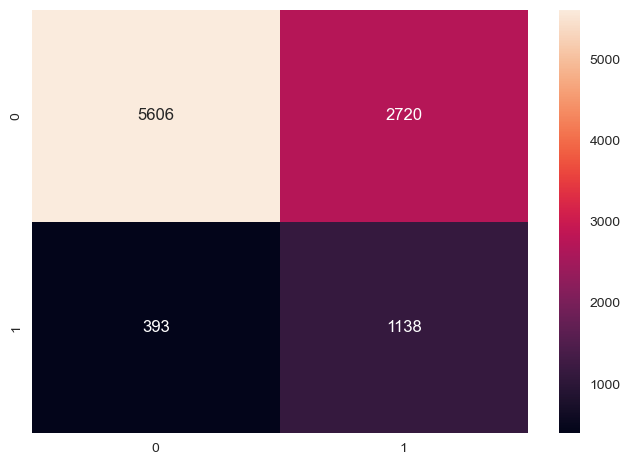

In [671]:
cm = confusion_matrix(ytest,model.predict(xtest))
sns.heatmap(cm,annot=True,fmt='d')
# 

In [677]:
fpr,tpr,th = roc_curve(ytest,model.predict_proba(xtest)[:,1])
auc = roc_auc_score(ytest,model.predict_proba(xtest)[:,1])

Text(0.0, 0.8, ' AUC score is 0.7693085787472074')

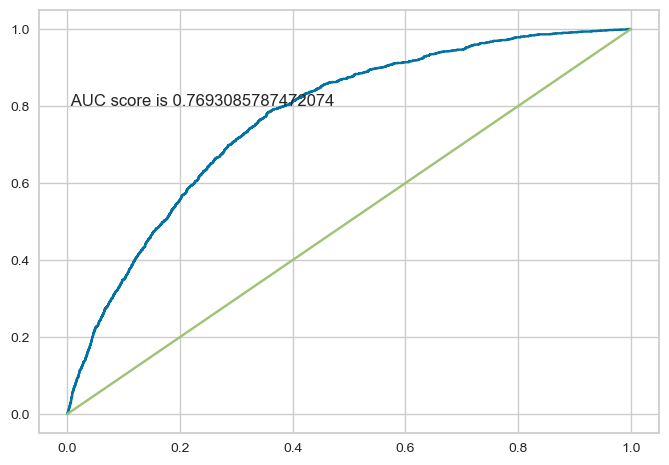

In [679]:
plt.plot(fpr,tpr)
plt.plot([0,1],[0,1])
plt.text(0.0,0.8,f' AUC score is {auc}')

In [687]:
f_imp = pd.DataFrame({'features':xtrain_rus.columns,'score':model.feature_importances_})
f_imp.sort_values(by ='score',ascending=False,inplace=True)
f_imp

,features,score
8,Origin,0.180543
9,Destination,0.124261
1,purchase_lead,0.115189
16,continent_Oceania,0.107675
2,length_of_stay,0.096068
3,flight_hour,0.068829
13,continent_Asia,0.068236
7,flight_duration,0.063060
4,wants_extra_baggage,0.028235
0,num_passengers,0.027852


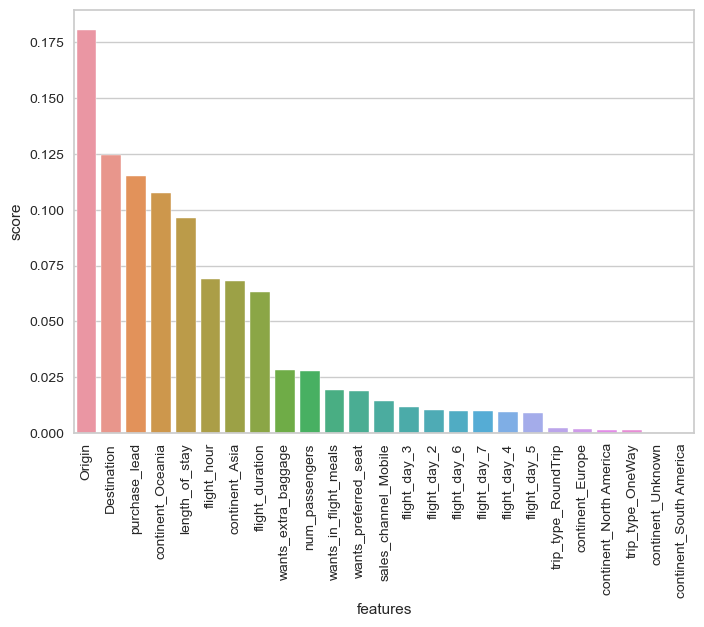

In [692]:
# Top 10 Features by model 
sns.barplot(f_imp['features'],f_imp['score'])
plt.xticks(rotation  =90)
plt.show()


# The Most important feature is origin of customer, destination followed by purchase lead. also customer from continent oceania is more probable to book compared to other continents , then length o stay and flight duration  least important feature is south_american continent,trip one way etc

# The Model has limitation on identifying FP , model wants more important features that has strong impact on target. like discount offers rate etc so that might help in prediction. the given features hadnt a strong impact on prediction as evident in EDA.

# Also the data is imbalanced that is why the bias in prediction in +ve class. so more data is required in predicting +ve class correctly

# Even after trying diff sampling techniques to balance the data and trying diff feature engg and feature extarction, transformation techniques there is no improvement. so new features are required 


# So to improve the model prediction more customer centre features are required and also more data on +ve class is required.

# We will try to build a neural network

In [702]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras import layers
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam
from keras.metrics import Precision, Recall,F1Score

In [700]:
input1 = layers.Input(shape=(xtrain_re.shape[1],))
hid = layers.Dense(128,activation='relu')(input1)
hid2 = layers.Dense(64,activation='relu')(hid)
hid3 = layers.Dense(32,activation='relu')(hid2)
output1 = layers.Dense(1,activation='sigmoid')(hid3)
model = keras.Model(inputs=input1, outputs=output1)


In [701]:
model.compile(optimizer='adam', loss='b', metrics=['accuracy'])


In [703]:
model.compile(optimizer=Adam(lr=0.001), 
              loss='binary_crossentropy',
              metrics=[ F1Score(),Precision(), Recall()])

In [715]:
ytrain_re = np.array(ytrain_re)
xtrain_re = np.array(xtrain_re)
xtest = np.array(xtest).astype(float)
ytest = np.array(ytest).astype(float)
ytrain_re = ytrain_re.astype(float) 


In [716]:
model.fit(xtrain_re, ytrain_re, epochs=10, batch_size=32, validation_data=(xtest,ytest))


Epoch 1/10
2098/2098 [==============================] - 3s 1ms/step - loss: 0.5623 - f1_score: 0.6667 - precision: 0.6801 - recall: 0.7921 - val_loss: 0.6246 - val_f1_score: 0.2689 - val_precision: 0.2542 - val_recall: 0.7655
Epoch 2/10
2098/2098 [==============================] - 2s 1ms/step - loss: 0.5481 - f1_score: 0.6667 - precision: 0.6969 - recall: 0.7938 - val_loss: 0.5841 - val_f1_score: 0.2689 - val_precision: 0.2856 - val_recall: 0.6799
Epoch 3/10
2098/2098 [==============================] - 2s 1ms/step - loss: 0.5330 - f1_score: 0.6667 - precision: 0.7143 - recall: 0.7916 - val_loss: 0.5929 - val_f1_score: 0.2689 - val_precision: 0.2753 - val_recall: 0.6937
Epoch 4/10
2098/2098 [==============================] - 2s 1ms/step - loss: 0.5156 - f1_score: 0.6667 - precision: 0.7262 - recall: 0.7891 - val_loss: 0.6403 - val_f1_score: 0.2689 - val_precision: 0.2647 - val_recall: 0.7309
Epoch 5/10
2098/2098 [==============================] - 2s 1ms/step - loss: 0.4990 - f1_score: 0

In [717]:
input1 = layers.Input(shape=(xtrain_re.shape[1],))
hid = layers.Dense(128,activation='relu')(input1)
hid2 = layers.Dense(64,activation='relu')(hid)
hid3 = layers.Dense(32,activation='relu')(hid2)
output1 = layers.Dense(1,activation='sigmoid')(hid3)
model = keras.Model(inputs=input1, outputs=output1)


model.compile(optimizer=Adam(lr=0.01), 
              loss='binary_crossentropy',
              metrics=[ F1Score(),Precision(), Recall()])


model.fit(xtrain_re, ytrain_re, epochs=10, batch_size=100, validation_data=(xtest,ytest))


Epoch 1/10
672/672 [==============================] - 2s 2ms/step - loss: 0.6490 - f1_score: 0.6666 - precision_1: 0.6254 - recall_1: 0.7153 - val_loss: 0.6208 - val_f1_score: 0.2689 - val_precision_1: 0.2424 - val_recall_1: 0.7015
Epoch 2/10
672/672 [==============================] - 1s 1ms/step - loss: 0.6066 - f1_score: 0.6667 - precision_1: 0.6449 - recall_1: 0.7614 - val_loss: 0.5681 - val_f1_score: 0.2689 - val_precision_1: 0.2562 - val_recall_1: 0.6597
Epoch 3/10
672/672 [==============================] - 1s 1ms/step - loss: 0.5979 - f1_score: 0.6667 - precision_1: 0.6504 - recall_1: 0.7631 - val_loss: 0.6123 - val_f1_score: 0.2689 - val_precision_1: 0.2496 - val_recall_1: 0.7655
Epoch 4/10
672/672 [==============================] - 1s 1ms/step - loss: 0.5886 - f1_score: 0.6667 - precision_1: 0.6560 - recall_1: 0.7766 - val_loss: 0.5737 - val_f1_score: 0.2689 - val_precision_1: 0.2646 - val_recall_1: 0.7054
Epoch 5/10
672/672 [==============================] - 1s 1ms/step - loss

# Even complex Neural Networks are not learning from the data